## Importing Libraries

In [1]:
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore                                        # ZSCORE SCALING
from sklearn.preprocessing import StandardScaler                      # ZScore
from sklearn.preprocessing import MinMaxScaler                        # Min Max Scaler
from sklearn.linear_model import LogisticRegression                   # Logistic Regression
from sklearn import metrics, model_selection                          # Evaluation Metrics
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, accuracy_score, roc_auc_score, roc_curve, precision_recall_curve
from sklearn.model_selection import train_test_split, GridSearchCV    # Train test Split and Grid Search

# Ignore warnings
warnings.filterwarnings('ignore')

# Display settings
%matplotlib inline
sns.set(color_codes=True)
sns.set_palette('Accent_r')
%config InlineBackend.figure_format ='retina'
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.expand_frame_repr', False)
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# Suppress warnings
warnings.filterwarnings("ignore")



## Loading dataset

In [2]:
df=pd.read_excel(r"C:\Users\lavan\Downloads\CompData-1 (2).xlsx")

In [3]:
df.head()

,Co_Code,Co_Name,_Operating_Expense_Rate,_Research_and_development_expense_rate,_Cash_flow_rate,_Interest_bearing_debt_interest_rate,_Tax_rate_A,_Cash_Flow_Per_Share,_Per_Share_Net_profit_before_tax_Yuan_,_Realized_Sales_Gross_Profit_Growth_Rate,_Operating_Profit_Growth_Rate,_Continuous_Net_Profit_Growth_Rate,_Total_Asset_Growth_Rate,_Net_Value_Growth_Rate,_Total_Asset_Return_Growth_Rate_Ratio,_Cash_Reinvestment_perc,_Current_Ratio,_Quick_Ratio,_Interest_Expense_Ratio,_Total_debt_to_Total_net_worth,_Long_term_fund_suitability_ratio_A,_Net_profit_before_tax_to_Paid_in_capital,_Total_Asset_Turnover,_Accounts_Receivable_Turnover,_Average_Collection_Days,_Inventory_Turnover_Rate_times,_Fixed_Assets_Turnover_Frequency,_Net_Worth_Turnover_Rate_times,_Operating_profit_per_person,_Allocation_rate_per_person,_Quick_Assets_to_Total_Assets,_Cash_to_Total_Assets,_Quick_Assets_to_Current_Liability,_Cash_to_Current_Liability,_Operating_Funds_to_Liability,_Inventory_to_Working_Capital,_Inventory_to_Current_Liability,_Long_term_Liability_to_Current_Assets,_Retained_Earnings_to_Total_Assets,_Total_income_to_Total_expense,_Total_expense_to_Assets,_Current_Asset_Turnover_Rate,_Quick_Asset_Turnover_Rate,_Cash_Turnover_Rate,_Fixed_Assets_to_Assets,_Cash_Flow_to_Total_Assets,_Cash_Flow_to_Liability,_CFO_to_Assets,_Cash_Flow_to_Equity,_Current_Liability_to_Current_Assets,_Liability_Assets_Flag,_Total_assets_to_GNP_price,_No_credit_Interval,_Degree_of_Financial_Leverage_DFL,_Interest_Coverage_Ratio_Interest_expense_to_EBIT,_Net_Income_Flag,_Equity_to_Liability,Default
0,16974,Hind.Cables,8.820000e+09,0.000000e+00,0.462045,0.000352,0.001417,0.322558,0.194472,0.022074,0.848021,0.217590,7.500000e+09,0.000441,0.263902,0.369137,0.008324,0.000255,0.631513,0.026006,0.005767,0.192859,0.053973,0.014004,0.000452,7.070000e+08,3.048690e-04,0.029839,0.611689,0.139494,0.176438,0.025626,0.001509,0.000676,0.342391,0.278434,0.017945,0.003064,0.937630,0.002687,0.007059,0.000732,1.420410e-04,5.470000e+09,0.094270,0.632666,0.458073,0.576869,0.310901,0.034913,0,0.028801,0.620927,0.026930,0.565744,1,0.015338,0
1,21214,Tata Tele. Mah.,9.380000e+09,4.230000e+09,0.460116,0.000716,0.000000,0.315520,0.161633,0.021902,0.839645,0.217360,6.750000e+09,0.000403,0.263714,0.372676,0.006939,0.004787,0.628055,0.006812,0.005230,0.160682,0.056972,0.000306,0.020645,2.782020e-04,8.850000e+09,0.018387,0.386626,0.022805,0.402040,0.004529,0.006584,0.000216,0.337476,0.277221,0.001271,0.004813,0.926251,0.002044,0.015441,0.000301,2.985590e-04,8.820000e+08,0.351895,0.642967,0.459282,0.551523,0.314572,0.041653,0,0.006191,0.622513,0.026297,0.560741,1,0.029445,1
2,14852,ABG Shipyard,3.800000e+09,8.150000e+08,0.449893,0.000496,0.000000,0.299851,0.172554,0.022186,0.848196,0.217573,9.680000e+09,0.000452,0.264095,0.348860,0.008669,0.005912,0.631688,0.004105,0.005139,0.171548,0.154423,0.001045,0.006048,1.698640e-04,1.490300e-04,0.029839,0.393263,0.012358,0.318921,0.008242,0.006090,0.000458,0.306993,0.277473,0.007012,0.000000,0.933155,0.002324,0.009771,0.000127,9.410000e+08,6.790000e+08,0.463276,0.644486,0.459700,0.463045,0.314777,0.033560,0,0.001095,0.623749,0.027276,0.566744,1,0.041718,0
3,2439,GTL,6.440000e+09,0.000000e+00,0.462731,0.000592,0.009313,0.319834,0.174738,0.027638,0.848391,0.217662,7.520000e+09,0.000448,0.264766,0.379876,0.017750,0.001738,0.632588,0.007846,0.011960,0.172159,0.101949,0.005411,0.001169,1.340000e+09,1.826942e-03,0.028387,0.439780,0.009049,0.137092,0.053510,0.002437,0.002793,0.343500,0.277630,0.039872,0.004472,0.928037,0.002334,0.013607,0.000401,5.310000e+09,6.020000e+09,0.026433,0.656832,0.461860,0.577212,0.316974,0.016527,0,0.003749,0.622963,0.026988,0.565950,1,0.026956,0
4,23505,Bharati Defence,3.680000e+09,0.000000e+00,0.463117,0.000782,0.400243,0.325104,0.176546,0.022072,0.847987,0.217589,7.120000e+09,0.000454,0.263966,0.389609,0.008427,0.003967,0.632682,0.013671,0.005822,0.175598,0.163418,0.000814,0.007776,1.341330e-04,8.298780e-04,0.052258,0.392766,0.002069,0.739193,0.08

In [4]:
# Define a dictionary to map old column names to new column names
column_mapping = {
    'Co_Code': 'Company_Code',
    'Co_Name': 'Company_Name',
    '_Operating_Expense_Rate': 'Operating_Expense_Rate',
    '_Research_and_development_expense_rate': 'Research_and_Development_Expense_Rate',
    '_Cash_flow_rate': 'Cash_Flow_Rate',
    '_Interest_bearing_debt_interest_rate': 'Interest_Bearing_Debt_Interest_Rate',
    '_Tax_rate_A': 'Tax_Rate_A',
    '_Cash_Flow_Per_Share': 'Cash_Flow_Per_Share',
    '_Per_Share_Net_profit_before_tax_Yuan_': 'Per_Share_Net_Profit_Before_Tax_Yuan',
    '_Realized_Sales_Gross_Profit_Growth_Rate': 'Realized_Sales_Gross_Profit_Growth_Rate',
    '_Operating_Profit_Growth_Rate': 'Operating_Profit_Growth_Rate',
    '_Continuous_Net_Profit_Growth_Rate': 'Continuous_Net_Profit_Growth_Rate',
    '_Total_Asset_Growth_Rate': 'Total_Asset_Growth_Rate',
    '_Net_Value_Growth_Rate': 'Net_Value_Growth_Rate',
    '_Total_Asset_Return_Growth_Rate_Ratio': 'Total_Asset_Return_Growth_Rate_Ratio',
    '_Cash_Reinvestment_perc': 'Cash_Reinvestment_Percentage',
    '_Current_Ratio': 'Current_Ratio',
    '_Quick_Ratio': 'Quick_Ratio',
    '_Interest_Expense_Ratio': 'Interest_Expense_Ratio',
    '_Total_debt_to_Total_net_worth': 'Total_Debt_to_Total_Net_Worth',
    '_Long_term_fund_suitability_ratio_A': 'Long_Term_Fund_Suitability_Ratio_A',
    '_Net_profit_before_tax_to_Paid_in_capital': 'Net_Profit_Before_Tax_to_Paid_in_Capital',
    '_Total_Asset_Turnover': 'Total_Asset_Turnover',
    '_Accounts_Receivable_Turnover': 'Accounts_Receivable_Turnover',
    '_Average_Collection_Days': 'Average_Collection_Days',
    '_Inventory_Turnover_Rate_times': 'Inventory_Turnover_Rate_Times',
    '_Fixed_Assets_Turnover_Frequency': 'Fixed_Assets_Turnover_Frequency',
    '_Net_Worth_Turnover_Rate_times': 'Net_Worth_Turnover_Rate_Times',
    '_Operating_profit_per_person': 'Operating_Profit_Per_Person',
    '_Allocation_rate_per_person': 'Allocation_Rate_Per_Person',
    '_Quick_Assets_to_Total_Assets': 'Quick_Assets_to_Total_Assets',
    '_Cash_to_Total_Assets': 'Cash_to_Total_Assets',
    '_Quick_Assets_to_Current_Liability': 'Quick_Assets_to_Current_Liability',
    '_Cash_to_Current_Liability': 'Cash_to_Current_Liability',
    '_Operating_Funds_to_Liability': 'Operating_Funds_to_Liability',
    '_Inventory_to_Working_Capital': 'Inventory_to_Working_Capital',
    '_Inventory_to_Current_Liability': 'Inventory_to_Current_Liability',
    '_Long_term_Liability_to_Current_Assets': 'Long_term_Liability_to_Current_Assets',
    '_Retained_Earnings_to_Total_Assets': 'Retained_Earnings_to_Total_Assets',
    '_Total_income_to_Total_expense': 'Total_Income_to_Total_Expense',
    '_Total_expense_to_Assets': 'Total_Expense_to_Assets',
    '_Current_Asset_Turnover_Rate': 'Current_Asset_Turnover_Rate',
    '_Quick_Asset_Turnover_Rate': 'Quick_Asset_Turnover_Rate',
    '_Cash_Turnover_Rate': 'Cash_Turnover_Rate',
    '_Fixed_Assets_to_Assets': 'Fixed_Assets_to_Assets',
    '_Cash_Flow_to_Total_Assets': 'Cash_Flow_to_Total_Assets',
    '_Cash_Flow_to_Liability': 'Cash_Flow_to_Liability',
    '_CFO_to_Assets': 'CFO_to_Assets',
    '_Cash_Flow_to_Equity': 'Cash_Flow_to_Equity',
    '_Current_Liability_to_Current_Assets': 'Current_Liability_to_Current_Assets',
    '_Liability_Assets_Flag': 'Liability_Assets_Flag',
    '_Total_assets_to_GNP_price': 'Total_assets_to_GNP_price',
    '_No_credit_Interval': 'No_credit_Interval',
    '_Degree_of_Financial_Leverage_DFL': 'Degree_of_Financial_Leverage_DFL',
    '_Interest_Coverage_Ratio_Interest_expense_to_EBIT': 'Interest_Coverage_Ratio_Interest_expense_to_EBIT',
    '_Net_Income_Flag': 'Net_Income_Flag',
    '_Equity_to_Liability': 'Equity_to_Liability',
    'Default': 'Default'
}

# Rename columns using the dictionary
df.rename(columns=column_mapping, inplace=True)



In [5]:
df.head()

,Company_Code,Company_Name,Operating_Expense_Rate,Research_and_Development_Expense_Rate,Cash_Flow_Rate,Interest_Bearing_Debt_Interest_Rate,Tax_Rate_A,Cash_Flow_Per_Share,Per_Share_Net_Profit_Before_Tax_Yuan,Realized_Sales_Gross_Profit_Growth_Rate,Operating_Profit_Growth_Rate,Continuous_Net_Profit_Growth_Rate,Total_Asset_Growth_Rate,Net_Value_Growth_Rate,Total_Asset_Return_Growth_Rate_Ratio,Cash_Reinvestment_Percentage,Current_Ratio,Quick_Ratio,Interest_Expense_Ratio,Total_Debt_to_Total_Net_Worth,Long_Term_Fund_Suitability_Ratio_A,Net_Profit_Before_Tax_to_Paid_in_Capital,Total_Asset_Turnover,Accounts_Receivable_Turnover,Average_Collection_Days,Inventory_Turnover_Rate_Times,Fixed_Assets_Turnover_Frequency,Net_Worth_Turnover_Rate_Times,Operating_Profit_Per_Person,Allocation_Rate_Per_Person,Quick_Assets_to_Total_Assets,Cash_to_Total_Assets,Quick_Assets_to_Current_Liability,Cash_to_Current_Liability,Operating_Funds_to_Liability,Inventory_to_Working_Capital,Inventory_to_Current_Liability,Long_term_Liability_to_Current_Assets,Retained_Earnings_to_Total_Assets,Total_Income_to_Total_Expense,Total_Expense_to_Assets,Current_Asset_Turnover_Rate,Quick_Asset_Turnover_Rate,Cash_Turnover_Rate,Fixed_Assets_to_Assets,Cash_Flow_to_Total_Assets,Cash_Flow_to_Liability,CFO_to_Assets,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Liability_Assets_Flag,Total_assets_to_GNP_price,No_credit_Interval,Degree_of_Financial_Leverage_DFL,Interest_Coverage_Ratio_Interest_expense_to_EBIT,Net_Income_Flag,Equity_to_Liability,Default
0,16974,Hind.Cables,8.820000e+09,0.000000e+00,0.462045,0.000352,0.001417,0.322558,0.194472,0.022074,0.848021,0.217590,7.500000e+09,0.000441,0.263902,0.369137,0.008324,0.000255,0.631513,0.026006,0.005767,0.192859,0.053973,0.014004,0.000452,7.070000e+08,3.048690e-04,0.029839,0.611689,0.139494,0.176438,0.025626,0.001509,0.000676,0.342391,0.278434,0.017945,0.003064,0.937630,0.002687,0.007059,0.000732,1.420410e-04,5.470000e+09,0.094270,0.632666,0.458073,0.576869,0.310901,0.034913,0,0.028801,0.620927,0.026930,0.565744,1,0.015338,0
1,21214,Tata Tele. Mah.,9.380000e+09,4.230000e+09,0.460116,0.000716,0.000000,0.315520,0.161633,0.021902,0.839645,0.217360,6.750000e+09,0.000403,0.263714,0.372676,0.006939,0.004787,0.628055,0.006812,0.005230,0.160682,0.056972,0.000306,0.020645,2.782020e-04,8.850000e+09,0.018387,0.386626,0.022805,0.402040,0.004529,0.006584,0.000216,0.337476,0.277221,0.001271,0.004813,0.926251,0.002044,0.015441,0.000301,2.985590e-04,8.820000e+08,0.351895,0.642967,0.459282,0.551523,0.314572,0.041653,0,0.006191,0.622513,0.026297,0.560741,1,0.029445,1
2,14852,ABG Shipyard,3.800000e+09,8.150000e+08,0.449893,0.000496,0.000000,0.299851,0.172554,0.022186,0.848196,0.217573,9.680000e+09,0.000452,0.264095,0.348860,0.008669,0.005912,0.631688,0.004105,0.005139,0.171548,0.154423,0.001045,0.006048,1.698640e-04,1.490300e-04,0.029839,0.393263,0.012358,0.318921,0.008242,0.006090,0.000458,0.306993,0.277473,0.007012,0.000000,0.933155,0.002324,0.009771,0.000127,9.410000e+08,6.790000e+08,0.463276,0.644486,0.459700,0.463045,0.314777,0.033560,0,0.001095,0.623749,0.027276,0.566744,1,0.041718,0
3,2439,GTL,6.440000e+09,0.000000e+00,0.462731,0.000592,0.009313,0.319834,0.174738,0.027638,0.848391,0.217662,7.520000e+09,0.000448,0.264766,0.379876,0.017750,0.001738,0.632588,0.007846,0.011960,0.172159,0.101949,0.005411,0.001169,1.340000e+09,1.826942e-03,0.028387,0.439780,0.009049,0.137092,0.053510,0.002437,0.002793,0.343500,0.277630,0.039872,0.004472,0.928037,0.002334,0.013607,0.000401,5.310000e+09,6.020000e+09,0.026433,0.656832,0.461860,0.577212,0.316974,0.016527,0,0.003749,0.622963,0.026988,0.565950,1,0.026956,0
4,23505,Bharati Defence,3.680000e+09,0.000000e+00,0.463117,0.000782,0.400243,0.325104,0.176546,0.022072,0.847987,0.217589,7.120000e+09,0.000454,0.263966,0.389609,0.008427,0.003967,0.632682,0.013671,0.005822,0.175598,0.163418,0.000814,0.007776,1.341330e-04,8.298780e-04,0.052258,0.392766,0.002069,0.739193,0.082328,0.007271,0.002376,0.345796,0.277235

In [6]:
df.shape

(2058, 58)

Eliminating unnecessary or redundant columns from the DataFrame, making it more suitable for subsequent analysis or modeling tasks

In [7]:
df.drop(['Company_Code', 'Company_Name'], axis=1, inplace=True)
df.head()

,Operating_Expense_Rate,Research_and_Development_Expense_Rate,Cash_Flow_Rate,Interest_Bearing_Debt_Interest_Rate,Tax_Rate_A,Cash_Flow_Per_Share,Per_Share_Net_Profit_Before_Tax_Yuan,Realized_Sales_Gross_Profit_Growth_Rate,Operating_Profit_Growth_Rate,Continuous_Net_Profit_Growth_Rate,Total_Asset_Growth_Rate,Net_Value_Growth_Rate,Total_Asset_Return_Growth_Rate_Ratio,Cash_Reinvestment_Percentage,Current_Ratio,Quick_Ratio,Interest_Expense_Ratio,Total_Debt_to_Total_Net_Worth,Long_Term_Fund_Suitability_Ratio_A,Net_Profit_Before_Tax_to_Paid_in_Capital,Total_Asset_Turnover,Accounts_Receivable_Turnover,Average_Collection_Days,Inventory_Turnover_Rate_Times,Fixed_Assets_Turnover_Frequency,Net_Worth_Turnover_Rate_Times,Operating_Profit_Per_Person,Allocation_Rate_Per_Person,Quick_Assets_to_Total_Assets,Cash_to_Total_Assets,Quick_Assets_to_Current_Liability,Cash_to_Current_Liability,Operating_Funds_to_Liability,Inventory_to_Working_Capital,Inventory_to_Current_Liability,Long_term_Liability_to_Current_Assets,Retained_Earnings_to_Total_Assets,Total_Income_to_Total_Expense,Total_Expense_to_Assets,Current_Asset_Turnover_Rate,Quick_Asset_Turnover_Rate,Cash_Turnover_Rate,Fixed_Assets_to_Assets,Cash_Flow_to_Total_Assets,Cash_Flow_to_Liability,CFO_to_Assets,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Liability_Assets_Flag,Total_assets_to_GNP_price,No_credit_Interval,Degree_of_Financial_Leverage_DFL,Interest_Coverage_Ratio_Interest_expense_to_EBIT,Net_Income_Flag,Equity_to_Liability,Default
0,8.820000e+09,0.000000e+00,0.462045,0.000352,0.001417,0.322558,0.194472,0.022074,0.848021,0.217590,7.500000e+09,0.000441,0.263902,0.369137,0.008324,0.000255,0.631513,0.026006,0.005767,0.192859,0.053973,0.014004,0.000452,7.070000e+08,3.048690e-04,0.029839,0.611689,0.139494,0.176438,0.025626,0.001509,0.000676,0.342391,0.278434,0.017945,0.003064,0.937630,0.002687,0.007059,0.000732,1.420410e-04,5.470000e+09,0.094270,0.632666,0.458073,0.576869,0.310901,0.034913,0,0.028801,0.620927,0.026930,0.565744,1,0.015338,0
1,9.380000e+09,4.230000e+09,0.460116,0.000716,0.000000,0.315520,0.161633,0.021902,0.839645,0.217360,6.750000e+09,0.000403,0.263714,0.372676,0.006939,0.004787,0.628055,0.006812,0.005230,0.160682,0.056972,0.000306,0.020645,2.782020e-04,8.850000e+09,0.018387,0.386626,0.022805,0.402040,0.004529,0.006584,0.000216,0.337476,0.277221,0.001271,0.004813,0.926251,0.002044,0.015441,0.000301,2.985590e-04,8.820000e+08,0.351895,0.642967,0.459282,0.551523,0.314572,0.041653,0,0.006191,0.622513,0.026297,0.560741,1,0.029445,1
2,3.800000e+09,8.150000e+08,0.449893,0.000496,0.000000,0.299851,0.172554,0.022186,0.848196,0.217573,9.680000e+09,0.000452,0.264095,0.348860,0.008669,0.005912,0.631688,0.004105,0.005139,0.171548,0.154423,0.001045,0.006048,1.698640e-04,1.490300e-04,0.029839,0.393263,0.012358,0.318921,0.008242,0.006090,0.000458,0.306993,0.277473,0.007012,0.000000,0.933155,0.002324,0.009771,0.000127,9.410000e+08,6.790000e+08,0.463276,0.644486,0.459700,0.463045,0.314777,0.033560,0,0.001095,0.623749,0.027276,0.566744,1,0.041718,0
3,6.440000e+09,0.000000e+00,0.462731,0.000592,0.009313,0.319834,0.174738,0.027638,0.848391,0.217662,7.520000e+09,0.000448,0.264766,0.379876,0.017750,0.001738,0.632588,0.007846,0.011960,0.172159,0.101949,0.005411,0.001169,1.340000e+09,1.826942e-03,0.028387,0.439780,0.009049,0.137092,0.053510,0.002437,0.002793,0.343500,0.277630,0.039872,0.004472,0.928037,0.002334,0.013607,0.000401,5.310000e+09,6.020000e+09,0.026433,0.656832,0.461860,0.577212,0.316974,0.016527,0,0.003749,0.622963,0.026988,0.565950,1,0.026956,0
4,3.680000e+09,0.000000e+00,0.463117,0.000782,0.400243,0.325104,0.176546,0.022072,0.847987,0.217589,7.120000e+09,0.000454,0.263966,0.389609,0.008427,0.003967,0.632682,0.013671,0.005822,0.175598,0.163418,0.000814,0.007776,1.341330e-04,8.298780e-04,0.052258,0.392766,0.002069,0.739193,0.082328,0.007271,0.002376,0.345796,0.277235,0.003342,0.000000,0.934421,0.002310,0.010493,0.000208,1.892020e-04,5.670000e+09,0.103303,0.656549,0.461238,0.594038

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2058 entries, 0 to 2057
Data columns (total 56 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   Operating_Expense_Rate                            2058 non-null   float64
 1   Research_and_Development_Expense_Rate             2058 non-null   float64
 2   Cash_Flow_Rate                                    2058 non-null   float64
 3   Interest_Bearing_Debt_Interest_Rate               2058 non-null   float64
 4   Tax_Rate_A                                        2058 non-null   float64
 5   Cash_Flow_Per_Share                               1891 non-null   float64
 6   Per_Share_Net_Profit_Before_Tax_Yuan              2058 non-null   float64
 7   Realized_Sales_Gross_Profit_Growth_Rate           2058 non-null   float64
 8   Operating_Profit_Growth_Rate                      2058 non-null   float64
 9   Continuous_Net_Prof

In [9]:
df.shape

(2058, 56)

In [10]:
# Set the display format for floating-point numbers
pd.options.display.float_format = '{:.2f}'.format

# Assuming df is your DataFrame
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Operating_Expense_Rate,2058.00,2052388835.76,3252623690.29,0.00,0.00,0.00,4110000000.00,9980000000.00
Research_and_Development_Expense_Rate,2058.00,1208634256.56,2144568158.08,0.00,0.00,0.00,1550000000.00,9980000000.00
Cash_Flow_Rate,2058.00,0.47,0.02,0.00,0.46,0.46,0.47,1.00
Interest_Bearing_Debt_Interest_Rate,2058.00,11130223.52,90425949.04,0.00,0.00,0.00,0.00,990000000.00
Tax_Rate_A,2058.00,0.11,0.15,0.00,0.00,0.04,0.22,1.00
Cash_Flow_Per_Share,1891.00,0.32,0.02,0.17,0.31,0.32,0.33,0.46
Per_Share_Net_Profit_Before_Tax_Yuan,2058.00,0.18,0.03,0.00,0.17,0.18,0.19,0.79
Realized_Sales_Gross_Profit_Growth_Rate,2058.00,0.02,0.02,0.00,0.02,0.02,0.02,1.00
Operating_Profit_Growth_Rate,2058.00,0.85,0.00,0.74,0.85,0.85,0.85,1.00
Continuous_Net_Profit_Growth_Rate,2058.00,0.22,0.01,0.00,0.22,0.22,0.22,0.23


## Checking duplicates

In [11]:
print('Number of Duplicates =', df.duplicated().sum().sum())

Number of Duplicates = 0


## Checking Missing Values

In [12]:
df.isnull().sum().sort_values(ascending=False)

Cash_Flow_Per_Share                                 167
Cash_to_Total_Assets                                 96
Total_Debt_to_Total_Net_Worth                        21
Current_Liability_to_Current_Assets                  14
Operating_Expense_Rate                                0
Cash_Turnover_Rate                                    0
Cash_to_Current_Liability                             0
Operating_Funds_to_Liability                          0
Inventory_to_Working_Capital                          0
Inventory_to_Current_Liability                        0
Long_term_Liability_to_Current_Assets                 0
Retained_Earnings_to_Total_Assets                     0
Total_Income_to_Total_Expense                         0
Total_Expense_to_Assets                               0
Current_Asset_Turnover_Rate                           0
Quick_Asset_Turnover_Rate                             0
Cash_Flow_to_Total_Assets                             0
Fixed_Assets_to_Assets                          

In [13]:
missing_values = df.isnull().sum().sum()
total_cells = df.size
percentage_missing_values = (missing_values / total_cells) * 100

print("Overall sum of missing values:", missing_values)
print("Percentage of missing values across all columns:", percentage_missing_values)


Overall sum of missing values: 298
Percentage of missing values across all columns: 0.2585728168818548


## Imputing Missing Values

In [14]:
from sklearn.impute import SimpleImputer


# Instantiate the SimpleImputer with strategy='median'
imputer = SimpleImputer(strategy='median')

# Fit the imputer on the data
imputer.fit(df)

# Transform the data, replacing missing values with the median
imputed_data = imputer.transform(df)

# Convert the transformed data back to a DataFrame
predictors_imputed = pd.DataFrame(imputed_data, columns=df.columns)
# Check if there are any remaining missing values after imputation
print(predictors_imputed.isnull().sum())


SimpleImputer(strategy='median')

Operating_Expense_Rate                              0
Research_and_Development_Expense_Rate               0
Cash_Flow_Rate                                      0
Interest_Bearing_Debt_Interest_Rate                 0
Tax_Rate_A                                          0
Cash_Flow_Per_Share                                 0
Per_Share_Net_Profit_Before_Tax_Yuan                0
Realized_Sales_Gross_Profit_Growth_Rate             0
Operating_Profit_Growth_Rate                        0
Continuous_Net_Profit_Growth_Rate                   0
Total_Asset_Growth_Rate                             0
Net_Value_Growth_Rate                               0
Total_Asset_Return_Growth_Rate_Ratio                0
Cash_Reinvestment_Percentage                        0
Current_Ratio                                       0
Quick_Ratio                                         0
Interest_Expense_Ratio                              0
Total_Debt_to_Total_Net_Worth                       0
Long_Term_Fund_Suitability_R

## Checking Outliers

In [15]:
# Calculate quartiles and IQR for different percentiles
Q1 = predictors_imputed.quantile(0.01)  # 1st percentile
Q99 = predictors_imputed.quantile(0.99)  # 99th percentile
Q5 = predictors_imputed.quantile(0.05)  # 5th percentile
Q95 = predictors_imputed.quantile(0.95)  # 95th percentile
Q25 = predictors_imputed.quantile(0.25)  # 25th percentile
Q75 = predictors_imputed.quantile(0.75)  # 75th percentile

# Calculate IQR for each percentile range
IQR_99_1 = Q99 - Q1
IQR_95_5 = Q95 - Q5
IQR_75_25 = Q75 - Q25

# Calculate upper and lower bounds for each percentile range
UL_99_1 = Q99 + 1.5 * IQR_99_1
LL_99_1 = Q1 - 1.5 * IQR_99_1

UL_95_5 = Q95 + 1.5 * IQR_95_5
LL_95_5 = Q5 - 1.5 * IQR_95_5

UL_75_25 = Q75 + 1.5 * IQR_75_25
LL_75_25 = Q25 - 1.5 * IQR_75_25

# Identify outliers for each percentile range
outliers_99_1 = (predictors_imputed < LL_99_1) | (predictors_imputed > UL_99_1)
outliers_95_5 = (predictors_imputed < LL_95_5) | (predictors_imputed > UL_95_5)
outliers_75_25 = (predictors_imputed < LL_75_25) | (predictors_imputed > UL_75_25)

# Count the number of outliers for each percentile range
outlier_counts_99_1 = outliers_99_1.sum().sum()  # Total sum for 99/1
outlier_counts_95_5 = outliers_95_5.sum().sum()  # Total sum for 95/5
outlier_counts_75_25 = outliers_75_25.sum().sum()  # Total sum for 75/25

outlier_counts_99_1, outlier_counts_95_5, outlier_counts_75_25


(273, 1278, 11143)

In [16]:
# Calculate the total number of data points
total_data_points = predictors_imputed.size

# Calculate the percentage of outliers for each percentile range
percentage_outliers_99_1 = (outlier_counts_99_1 / total_data_points) * 100
percentage_outliers_95_5 = (outlier_counts_95_5 / total_data_points) * 100
percentage_outliers_75_25 = (outlier_counts_75_25 / total_data_points) * 100

percentage_outliers_99_1, percentage_outliers_95_5, percentage_outliers_75_25


(0.2368804664723032, 1.1089129529362765, 9.668714424545328)

In [17]:
# Calculate the total number of outliers at the 95/5 level
total_outliers_95_5 = outliers_95_5.sum().sum()

# Display the total number of outliers
total_outliers_95_5


1278

In [18]:
# Define function to cap extreme values
def cap_outliers(series, lower_percentile=0.05, upper_percentile=0.95):
    lower_bound = series.quantile(lower_percentile)
    upper_bound = series.quantile(upper_percentile)
    series = np.where(series < lower_bound, lower_bound, series)
    series = np.where(series > upper_bound, upper_bound, series)
    return series

# Apply cap method to each numerical column in the DataFrame
for column in predictors_imputed.columns:
    predictors_imputed[column] = cap_outliers(predictors_imputed[column])

# Now, predictors contains the data with outliers treated using the cap method


In [19]:
# Calculate quartiles and IQR for numeric columns only
Q5 = predictors_imputed.quantile(0.05)  # 5th percentile
Q95 = predictors_imputed.quantile(0.95)  # 95th percentile
IQR = Q95 - Q5

# Calculate upper and lower bounds
UL = Q95 + 1.5 * IQR
LL = Q5 - 1.5 * IQR

# Identify outliers in numeric columns
outliers = (predictors_imputed < LL) | (predictors_imputed > UL)

# Count the number of outliers for each variable
outlier_counts = outliers.sum()
# Sort outlier counts in descending order
sorted_outlier_counts = outlier_counts.sort_values(ascending=False)

# Display sorted outlier counts
sorted_outlier_counts



Operating_Expense_Rate                              0
Research_and_Development_Expense_Rate               0
Quick_Assets_to_Current_Liability                   0
Cash_to_Current_Liability                           0
Operating_Funds_to_Liability                        0
Inventory_to_Working_Capital                        0
Inventory_to_Current_Liability                      0
Long_term_Liability_to_Current_Assets               0
Retained_Earnings_to_Total_Assets                   0
Total_Income_to_Total_Expense                       0
Total_Expense_to_Assets                             0
Current_Asset_Turnover_Rate                         0
Quick_Asset_Turnover_Rate                           0
Cash_Turnover_Rate                                  0
Fixed_Assets_to_Assets                              0
Cash_Flow_to_Total_Assets                           0
Cash_Flow_to_Liability                              0
CFO_to_Assets                                       0
Cash_Flow_to_Equity         

In [20]:
# Create DataFrame
df_original = pd.DataFrame(predictors_imputed)

# Create a copy of the original DataFrame
df_filtered = df_original.copy()

# Remove columns with nearly constant features
columns_to_drop = [
    "Interest_Bearing_Debt_Interest_Rate",
    "Realized_Sales_Gross_Profit_Growth_Rate",
    "Operating_Profit_Growth_Rate",
    "Continuous_Net_Profit_Growth_Rate",
    "Net_Value_Growth_Rate",
    "Total_Asset_Return_Growth_Rate_Ratio",
    "Current_Ratio",
    "Interest_Expense_Ratio",
    "Long_Term_Fund_Suitability_Ratio_A",
    "Accounts_Receivable_Turnover",
    "Inventory_to_Working_Capital",
    "Total_Income_to_Total_Expense",
    "Current_Asset_Turnover_Rate",
    "Cash_Flow_to_Liability",
    "Liability_Assets_Flag",
    "No_credit_Interval",
    "Degree_of_Financial_Leverage_DFL",
    "Interest_Coverage_Ratio_Interest_expense_to_EBIT",
    "Net_Income_Flag"
]

df_filtered.drop(columns=columns_to_drop, inplace=True)

# Optionally, you can save the filtered dataset to a new file
# df_filtered.to_csv('filtered_dataset.csv', index=False)

# Display the filtered DataFrame
df_filtered.head()


,Operating_Expense_Rate,Research_and_Development_Expense_Rate,Cash_Flow_Rate,Tax_Rate_A,Cash_Flow_Per_Share,Per_Share_Net_Profit_Before_Tax_Yuan,Total_Asset_Growth_Rate,Cash_Reinvestment_Percentage,Quick_Ratio,Total_Debt_to_Total_Net_Worth,Net_Profit_Before_Tax_to_Paid_in_Capital,Total_Asset_Turnover,Average_Collection_Days,Inventory_Turnover_Rate_Times,Fixed_Assets_Turnover_Frequency,Net_Worth_Turnover_Rate_Times,Operating_Profit_Per_Person,Allocation_Rate_Per_Person,Quick_Assets_to_Total_Assets,Cash_to_Total_Assets,Quick_Assets_to_Current_Liability,Cash_to_Current_Liability,Operating_Funds_to_Liability,Inventory_to_Current_Liability,Long_term_Liability_to_Current_Assets,Retained_Earnings_to_Total_Assets,Total_Expense_to_Assets,Quick_Asset_Turnover_Rate,Cash_Turnover_Rate,Fixed_Assets_to_Assets,Cash_Flow_to_Total_Assets,CFO_to_Assets,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Total_assets_to_GNP_price,Equity_to_Liability,Default
0,8820000000.00,0.00,0.46,0.00,0.32,0.19,7500000000.00,0.37,0.00,0.03,0.19,0.05,0.00,707000000.00,0.00,0.03,0.46,0.09,0.18,0.03,0.00,0.00,0.34,0.02,0.00,0.94,0.01,0.00,5470000000.00,0.09,0.63,0.58,0.31,0.03,0.03,0.02,0.00
1,8971500000.00,4230000000.00,0.46,0.00,0.32,0.16,6750000000.00,0.37,0.00,0.01,0.16,0.06,0.01,0.00,8020000000.00,0.02,0.39,0.02,0.40,0.01,0.01,0.00,0.34,0.00,0.00,0.93,0.02,0.00,882000000.00,0.35,0.64,0.55,0.31,0.04,0.01,0.03,1.00
2,3800000000.00,815000000.00,0.45,0.00,0.30,0.17,8980000000.00,0.35,0.01,0.00,0.17,0.15,0.01,0.00,0.00,0.03,0.39,0.01,0.32,0.01,0.01,0.00,0.32,0.01,0.00,0.93,0.01,941000000.00,679000000.00,0.46,0.64,0.48,0.31,0.03,0.00,0.04,0.00
3,6440000000.00,0.00,0.46,0.01,0.32,0.17,7520000000.00,0.38,0.00,0.01,0.17,0.10,0.00,1340000000.00,0.00,0.03,0.44,0.01,0.14,0.05,0.00,0.00,0.34,0.03,0.00,0.93,0.01,5310000000.00,6020000000.00,0.03,0.66,0.58,0.32,0.02,0.00,0.03,0.00
4,3680000000.00,0.00,0.46,0.34,0.33,0.18,7120000000.00,0.39,0.00,0.01,0.18,0.16,0.01,0.00,0.00,0.05,0.39,0.00,0.74,0.08,0.01,0.00,0.35,0.00,0.00,0.93,0.01,0.00,5670000000.00,0.10,0.66,0.59,0.32,0.03,0.01,0.02,0.00


In [21]:
df_filtered.shape

(2058, 37)

## Plot the correlation heatmap of the predictor variables.

In [22]:
df_filtered.corr()

,Operating_Expense_Rate,Research_and_Development_Expense_Rate,Cash_Flow_Rate,Tax_Rate_A,Cash_Flow_Per_Share,Per_Share_Net_Profit_Before_Tax_Yuan,Total_Asset_Growth_Rate,Cash_Reinvestment_Percentage,Quick_Ratio,Total_Debt_to_Total_Net_Worth,Net_Profit_Before_Tax_to_Paid_in_Capital,Total_Asset_Turnover,Average_Collection_Days,Inventory_Turnover_Rate_Times,Fixed_Assets_Turnover_Frequency,Net_Worth_Turnover_Rate_Times,Operating_Profit_Per_Person,Allocation_Rate_Per_Person,Quick_Assets_to_Total_Assets,Cash_to_Total_Assets,Quick_Assets_to_Current_Liability,Cash_to_Current_Liability,Operating_Funds_to_Liability,Inventory_to_Current_Liability,Long_term_Liability_to_Current_Assets,Retained_Earnings_to_Total_Assets,Total_Expense_to_Assets,Quick_Asset_Turnover_Rate,Cash_Turnover_Rate,Fixed_Assets_to_Assets,Cash_Flow_to_Total_Assets,CFO_to_Assets,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Total_assets_to_GNP_price,Equity_to_Liability,Default
Operating_Expense_Rate,1.00,-0.05,-0.01,0.07,-0.01,0.13,0.04,0.00,-0.10,0.12,0.13,0.22,-0.08,-0.02,-0.10,0.24,0.18,0.05,0.03,-0.09,-0.11,-0.09,-0.01,0.00,-0.02,0.14,-0.28,0.14,-0.01,-0.07,0.01,0.02,0.01,0.02,0.16,-0.15,-0.02
Research_and_Development_Expense_Rate,-0.05,1.00,0.08,-0.03,0.06,-0.00,-0.00,0.05,0.11,-0.11,0.00,0.10,0.09,0.09,0.01,0.02,-0.13,-0.20,0.12,0.11,0.12,0.01,0.08,-0.08,-0.00,0.02,0.09,0.02,0.10,0.03,-0.01,0.06,-0.00,-0.09,-0.07,0.06,0.07
Cash_Flow_Rate,-0.01,0.08,1.00,0.19,0.72,0.30,0.09,0.70,0.33,-0.34,0.30,-0.02,-0.12,-0.04,0.09,-0.16,0.09,0.02,-0.05,0.15,0.33,0.25,0.95,-0.02,0.02,0.36,-0.03,-0.02,0.01,0.18,0.18,0.85,0.16,-0.19,-0.00,0.40,-0.16
Tax_Rate_A,0.07,-0.03,0.19,1.00,0.17,0.46,0.10,0.14,0.08,-0.10,0.46,0.32,-0.03,-0.00,-0.14,0.24,0.16,-0.13,0.20,0.05,0.09,-0.03,0.20,-0.09,-0.12,0.40,-0.07,0.05,0.06,-0.03,0.07,0.20,0.08,-0.12,-0.11,0.02,-0.23
Cash_Flow_Per_Share,-0.01,0.06,0.72,0.17,1.00,0.26,0.09,0.89,0.08,-0.23,0.25,0.05,-0.06,-0.03,0.06,-0.04,0.02,-0.00,-0.02,0.11,0.09,0.06,0.76,-0.09,0.06,0.27,0.02,0.02,0.05,0.15,0.19,0.91,0.19,-0.02,0.01,0.13,-0.12
Per_Share_Net_Profit_Before_Tax_Yuan,0.13,-0.00,0.30,0.46,0.26,1.00,0.04,0.15,0.13,-0.24,0.99,0.27,-0.20,-0.06,-0.14,0.12,0.55,-0.06,0.06,0.11,0.11,0.03,0.30,0.07,-0.09,0.80,-0.28,0.07,0.04,-0.14,0.17,0.28,0.19,-0.27,0.00,0.11,-0.41
Total_Asset_Growth_Rate,0.04,-0.00,0.09,0.10,0.09,0.04,1.00,0.11,-0.10,-0.07,0.05,-0.07,-0.01,0.03,0.02,-0.09,0.02,0.05,-0.12,-0.17,-0.10,-0.12,0.09,0.01,0.02,0.14,-0.12,0.05,0.10,0.06,-0.14,0.12,-0.14,0.03,0.08,-0.02,-0.06
Cash_Reinvestment_Percentage,0.00,0.05,0.70,0.14,0.89,0.15,0.11,1.00,0.08,-0.21,0.15,0.05,-0.01,-0.01,0.06,-0.03,-0.04,0.00,-0.00,0.11,0.08,0.06,0.76,-0.10,0.04,0.20,0.01,-0.00,0.05,0.15,0.19,0.93,0.20,-0.00,-0.01,0.12,-0.10
Quick_Ratio,-0.10,0.11,0.33,0.08,0.08,0.13,-0.10,0.08,1.00,-0.47,0.13,0.03,0.10,-0.00,-0.05,-0.17,-0.08,-0.22,0.45,0.51,0.95,0.67,0.29,0.03,-0.18,0.15,0.16,-0.23,-0.13,-0.12,0.14,0.11,0.12,-0.64,-0.20,0.75,-0.19
Total_Debt_to_Total_Net_Worth,0.12,-0.11,-0.34,-0.10,-0.23,-0.24,-0.07,-0.21,-0.47,1.00,-0.23,0.13,0.01,-0.06,-0.04,0.46,0.03,0.12,0.02,-0.24,-0.48,-0.28,-0.34,-0.10,0.12,-0.33,-0.00,0.13,0.04,-0.07,-0.06,-0.26,-0.05,0.50,0.12,-0.66,0.34


It is difficult to understand the extent of correlation by painstakingly looking at the numbers of the above matrix. So, let us plot a correlation heatmap.

<Figure size 4000x4000 with 0 Axes>

<Axes: >

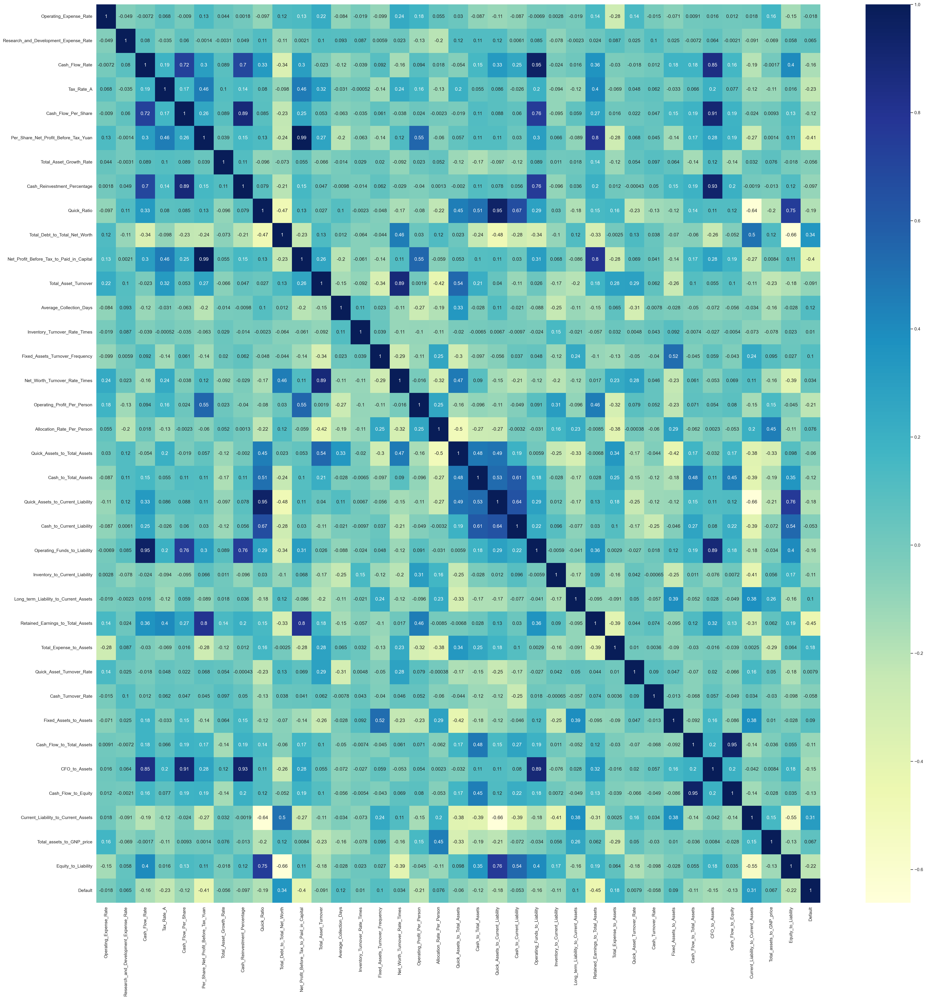

In [23]:
plt.figure(figsize=(40, 40))
sns.heatmap(df_filtered.corr(), cmap="YlGnBu", annot=True)
plt.show()


In [24]:
# Find pairs of columns with correlations above 0.7
highly_correlated_pairs = []
# Calculate the correlation matrix
correlation_matrix = df_filtered.corr()

# Iterate through the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.7:  # Adjust the threshold as needed
            colname1 = correlation_matrix.columns[i]
            colname2 = correlation_matrix.columns[j]
            correlation_value = correlation_matrix.iloc[i, j]
            highly_correlated_pairs.append((colname1, colname2, correlation_value))

# Print the highly correlated pairs
print("Highly correlated pairs with correlation above 0.7:")
for pair in highly_correlated_pairs:
    col1, col2, correlation = pair
    print(f"{col1} and {col2}: Correlation = {correlation:.2f}")

Highly correlated pairs with correlation above 0.7:
Cash_Flow_Per_Share and Cash_Flow_Rate: Correlation = 0.72
Cash_Reinvestment_Percentage and Cash_Flow_Per_Share: Correlation = 0.89
Net_Profit_Before_Tax_to_Paid_in_Capital and Per_Share_Net_Profit_Before_Tax_Yuan: Correlation = 0.99
Net_Worth_Turnover_Rate_Times and Total_Asset_Turnover: Correlation = 0.89
Quick_Assets_to_Current_Liability and Quick_Ratio: Correlation = 0.95
Operating_Funds_to_Liability and Cash_Flow_Rate: Correlation = 0.95
Operating_Funds_to_Liability and Cash_Flow_Per_Share: Correlation = 0.76
Operating_Funds_to_Liability and Cash_Reinvestment_Percentage: Correlation = 0.76
Retained_Earnings_to_Total_Assets and Per_Share_Net_Profit_Before_Tax_Yuan: Correlation = 0.80
Retained_Earnings_to_Total_Assets and Net_Profit_Before_Tax_to_Paid_in_Capital: Correlation = 0.80
CFO_to_Assets and Cash_Flow_Rate: Correlation = 0.85
CFO_to_Assets and Cash_Flow_Per_Share: Correlation = 0.91
CFO_to_Assets and Cash_Reinvestment_Perce

## Feature Selection

In [25]:
X = df_filtered.copy()

In [26]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [27]:
f = calc_vif(X).sort_values(by = 'VIF', ascending = False)
f

,variables,VIF
32,Cash_Flow_to_Equity,38164.44
2,Cash_Flow_Rate,35663.64
25,Retained_Earnings_to_Total_Assets,13251.29
10,Net_Profit_Before_Tax_to_Paid_in_Capital,10497.57
5,Per_Share_Net_Profit_Before_Tax_Yuan,9327.87
4,Cash_Flow_Per_Share,8239.35
30,Cash_Flow_to_Total_Assets,4942.49
16,Operating_Profit_Per_Person,916.07
15,Net_Worth_Turnover_Rate_Times,44.72
11,Total_Asset_Turnover,39.95


In [28]:
import time
start = time.time()

v = calc_vif(X).sort_values(by='VIF', ascending=False)
while v.iloc[0, 1] > 5:
    X = X.drop(columns=v.iloc[0, 0])
    v = calc_vif(X).sort_values(by='VIF', ascending=False)

end = time.time()
print('Time taken =', end - start)


Time taken = 652.2498550415039


In [29]:
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
3,Total_Asset_Growth_Rate,4.21
5,Average_Collection_Days,3.94
9,Cash_to_Total_Assets,3.59
8,Allocation_Rate_Per_Person,3.04
10,Cash_to_Current_Liability,2.18
17,Total_assets_to_GNP_price,2.18
2,Tax_Rate_A,1.92
14,Quick_Asset_Turnover_Rate,1.82
18,Equity_to_Liability,1.81
16,Fixed_Assets_to_Assets,1.72


In [30]:
X.shape

(2058, 20)

In [31]:
# Find all column names
column_names = X.columns.tolist()

# Print all column names
print("All column names:")
print(column_names)


All column names:
['Operating_Expense_Rate', 'Research_and_Development_Expense_Rate', 'Tax_Rate_A', 'Total_Asset_Growth_Rate', 'Total_Debt_to_Total_Net_Worth', 'Average_Collection_Days', 'Inventory_Turnover_Rate_Times', 'Fixed_Assets_Turnover_Frequency', 'Allocation_Rate_Per_Person', 'Cash_to_Total_Assets', 'Cash_to_Current_Liability', 'Inventory_to_Current_Liability', 'Long_term_Liability_to_Current_Assets', 'Total_Expense_to_Assets', 'Quick_Asset_Turnover_Rate', 'Cash_Turnover_Rate', 'Fixed_Assets_to_Assets', 'Total_assets_to_GNP_price', 'Equity_to_Liability', 'Default']


In [32]:
target = X['Default']
predictors = X.drop(columns=['Default'])

In [33]:
# Convert target variable to categorical
target = target.astype('category')


In [34]:
target.dtype

CategoricalDtype(categories=[0.0, 1.0], ordered=False)

## Univariate Analysis

In [35]:
predictors.describe().T

,count,mean,std,min,25%,50%,75%,max
Operating_Expense_Rate,2058.00,2024412402.33,3189377806.65,0.00,0.00,0.00,4110000000.00,8971500000.00
Research_and_Development_Expense_Rate,2058.00,1128341739.55,1896462943.93,0.00,0.00,0.00,1550000000.00,6236000000.00
Tax_Rate_A,2058.00,0.10,0.12,0.00,0.00,0.04,0.22,0.34
Total_Asset_Growth_Rate,2058.00,5266953830.42,2883918032.99,0.00,4315000000.00,6225000000.00,7220000000.00,8980000000.00
Total_Debt_to_Total_Net_Worth,2058.00,0.01,0.01,0.00,0.00,0.01,0.01,0.03
Average_Collection_Days,2058.00,0.01,0.00,0.00,0.00,0.01,0.01,0.01
Inventory_Turnover_Rate_Times,2058.00,2000941059.28,3008938344.28,0.00,0.00,19100000.00,3815000000.00,8713000000.00
Fixed_Assets_Turnover_Frequency,2058.00,1179586005.83,2499295142.31,0.00,0.00,0.00,0.01,8020000000.00
Allocation_Rate_Per_Person,2058.00,0.02,0.02,0.00,0.00,0.01,0.02,0.09
Cash_to_Total_Assets,2058.00,0.07,0.07,0.01,0.02,0.05,0.09,0.27


In [36]:
# Calculate skewness for numerical columns in X
skewness_values = predictors.skew()

# Print skewness for each numerical column
for column, skewness in skewness_values.items():
    print(f"Skewness for {column}: {skewness:.2f}")


Skewness for Operating_Expense_Rate: 1.18
Skewness for Research_and_Development_Expense_Rate: 1.61
Skewness for Tax_Rate_A: 0.65
Skewness for Total_Asset_Growth_Rate: -0.85
Skewness for Total_Debt_to_Total_Net_Worth: 1.08
Skewness for Average_Collection_Days: 0.51
Skewness for Inventory_Turnover_Rate_Times: 1.22
Skewness for Fixed_Assets_Turnover_Frequency: 1.90
Skewness for Allocation_Rate_Per_Person: 1.92
Skewness for Cash_to_Total_Assets: 1.53
Skewness for Cash_to_Current_Liability: 2.37
Skewness for Inventory_to_Current_Liability: 1.19
Skewness for Long_term_Liability_to_Current_Assets: 2.31
Skewness for Total_Expense_to_Assets: 1.50
Skewness for Quick_Asset_Turnover_Rate: 0.84
Skewness for Cash_Turnover_Rate: 0.79
Skewness for Fixed_Assets_to_Assets: 0.68
Skewness for Total_assets_to_GNP_price: 1.97
Skewness for Equity_to_Liability: 1.69


In [37]:
from scipy.stats import shapiro

# Loop through each variable
for column in X.columns:
    # Perform Shapiro-Wilk test
    stat, p = shapiro(X[column])
    
    # Define the significance level
    alpha = 0.05
    
    # Print the results
    if p > alpha:
        print(f"Variable {column}: Probably Gaussian (normal) distribution (p={p:.4f})")
    else:
        print(f"Variable {column}: Probably not Gaussian (normal) distribution (p={p:.4f})")


Variable Operating_Expense_Rate: Probably not Gaussian (normal) distribution (p=0.0000)
Variable Research_and_Development_Expense_Rate: Probably not Gaussian (normal) distribution (p=0.0000)
Variable Tax_Rate_A: Probably not Gaussian (normal) distribution (p=0.0000)
Variable Total_Asset_Growth_Rate: Probably not Gaussian (normal) distribution (p=0.0000)
Variable Total_Debt_to_Total_Net_Worth: Probably not Gaussian (normal) distribution (p=0.0000)
Variable Average_Collection_Days: Probably not Gaussian (normal) distribution (p=0.0000)
Variable Inventory_Turnover_Rate_Times: Probably not Gaussian (normal) distribution (p=0.0000)
Variable Fixed_Assets_Turnover_Frequency: Probably not Gaussian (normal) distribution (p=0.0000)
Variable Allocation_Rate_Per_Person: Probably not Gaussian (normal) distribution (p=0.0000)
Variable Cash_to_Total_Assets: Probably not Gaussian (normal) distribution (p=0.0000)
Variable Cash_to_Current_Liability: Probably not Gaussian (normal) distribution (p=0.0000)

In [38]:
import numpy as np
import pandas as pd
from scipy.stats import normaltest
from scipy.stats import zscore

# Assuming you have a DataFrame named 'X' containing both predictors and target
# Extracting predictors and target
target = X['Default']
predictors = X.drop(columns=['Default'])

# Interpretations for each predictor variable
interpretations = [
    "Moderately skewed to the right. Higher-than-average rates may be present.",
    "Highly skewed to the right. A significant number of observations with higher rates compared to the mean.",
    "Slightly skewed to the right. Some observations may have higher rates compared to the average. Bimodal or Multimodal Distribution",
    "Moderately skewed to the left. Some observations may have lower rates compared to the average.",
    "Moderately skewed to the right. Some observations may have higher levels compared to the average.",
    "Slightly skewed to the right. Some observations may have higher values compared to the mean.",
    "Moderately skewed to the right. Some observations may have higher rates compared to the mean.",
    "Highly skewed to the right. Some observations may have higher frequencies compared to the mean.",
    "Highly skewed to the right. Some observations may have higher rates compared to the mean.",
    "Moderately skewed to the right. Some observations may have higher ratios compared to the mean.",
    "Highly skewed to the right. A significant number of observations with higher ratios compared to the mean.",
    "Moderately skewed to the right. Some observations may have higher ratios compared to the mean.",
    "Highly skewed to the right. A significant number of observations with higher ratios compared to the mean.",
    "Moderately skewed to the right. Some observations may have higher ratios compared to the mean.",
    "Moderately skewed to the right. Some observations may have higher rates compared to the mean.",
    "Moderately skewed to the right. Some observations may have higher rates compared to the mean.",
    "Moderately skewed to the right. Some observations may have higher ratios compared to the mean.",
    "Highly skewed to the right. A significant number of observations with higher ratios compared to the mean.",
    "Moderately skewed to the right. Some observations may have higher ratios compared to the mean."
]

# Loop through each predictor variable
for predictor, interpretation in zip(predictors.columns, interpretations):
    mean = predictors[predictor].mean()
    std_dev = predictors[predictor].std()
    skewness = predictors[predictor].skew()  # Calculate skewness
    kurtosis = predictors[predictor].kurtosis()  # Calculate kurtosis
    _, p_value = normaltest(predictors[predictor])  # Perform normality test

    # Determine normality interpretation
    if p_value < 0.05:
        normality_interpretation = "Not Normally Distributed"
    else:
        normality_interpretation = "Normally Distributed"

    
    

    # Print interpretations for each predictor
    print(f"Variable: {predictor}")
    print("Interpretation:", interpretation)
    print(f"Normality: {normality_interpretation}")    
    print(f"Skewness: {skewness}")
    print(f"Kurtosis: {kurtosis}")
    print("\n")


Variable: Operating_Expense_Rate
Interpretation: Moderately skewed to the right. Higher-than-average rates may be present.
Normality: Not Normally Distributed
Skewness: 1.1848392294329404
Kurtosis: -0.2690554469957749


Variable: Research_and_Development_Expense_Rate
Interpretation: Highly skewed to the right. A significant number of observations with higher rates compared to the mean.
Normality: Not Normally Distributed
Skewness: 1.6127652276929367
Kurtosis: 1.260210743212741


Variable: Tax_Rate_A
Interpretation: Slightly skewed to the right. Some observations may have higher rates compared to the average. Bimodal or Multimodal Distribution
Normality: Not Normally Distributed
Skewness: 0.6496395059042707
Kurtosis: -1.1197646391629215


Variable: Total_Asset_Growth_Rate
Interpretation: Moderately skewed to the left. Some observations may have lower rates compared to the average.
Normality: Not Normally Distributed
Skewness: -0.8549674769146227
Kurtosis: -0.6331078822545191


Variable:

<Axes: xlabel='Operating_Expense_Rate', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Operating_Expense_Rate')

Text(0.5, 0, 'Operating_Expense_Rate')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Research_and_Development_Expense_Rate', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Research_and_Development_Expense_Rate')

Text(0.5, 0, 'Research_and_Development_Expense_Rate')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Tax_Rate_A', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Tax_Rate_A')

Text(0.5, 0, 'Tax_Rate_A')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Total_Asset_Growth_Rate', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Total_Asset_Growth_Rate')

Text(0.5, 0, 'Total_Asset_Growth_Rate')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Total_Debt_to_Total_Net_Worth', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Total_Debt_to_Total_Net_Worth')

Text(0.5, 0, 'Total_Debt_to_Total_Net_Worth')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Average_Collection_Days', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Average_Collection_Days')

Text(0.5, 0, 'Average_Collection_Days')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Inventory_Turnover_Rate_Times', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Inventory_Turnover_Rate_Times')

Text(0.5, 0, 'Inventory_Turnover_Rate_Times')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Fixed_Assets_Turnover_Frequency', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Fixed_Assets_Turnover_Frequency')

Text(0.5, 0, 'Fixed_Assets_Turnover_Frequency')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Allocation_Rate_Per_Person', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Allocation_Rate_Per_Person')

Text(0.5, 0, 'Allocation_Rate_Per_Person')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Cash_to_Total_Assets', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Cash_to_Total_Assets')

Text(0.5, 0, 'Cash_to_Total_Assets')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Cash_to_Current_Liability', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Cash_to_Current_Liability')

Text(0.5, 0, 'Cash_to_Current_Liability')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Inventory_to_Current_Liability', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Inventory_to_Current_Liability')

Text(0.5, 0, 'Inventory_to_Current_Liability')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Long_term_Liability_to_Current_Assets', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Long_term_Liability_to_Current_Assets')

Text(0.5, 0, 'Long_term_Liability_to_Current_Assets')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Total_Expense_to_Assets', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Total_Expense_to_Assets')

Text(0.5, 0, 'Total_Expense_to_Assets')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Quick_Asset_Turnover_Rate', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Quick_Asset_Turnover_Rate')

Text(0.5, 0, 'Quick_Asset_Turnover_Rate')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Cash_Turnover_Rate', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Cash_Turnover_Rate')

Text(0.5, 0, 'Cash_Turnover_Rate')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Fixed_Assets_to_Assets', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Fixed_Assets_to_Assets')

Text(0.5, 0, 'Fixed_Assets_to_Assets')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Total_assets_to_GNP_price', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Total_assets_to_GNP_price')

Text(0.5, 0, 'Total_assets_to_GNP_price')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='Equity_to_Liability', ylabel='Density'>

Text(0.5, 1.0, 'Distribution Plot for Equity_to_Liability')

Text(0.5, 0, 'Equity_to_Liability')

Text(0, 0.5, 'Frequency')

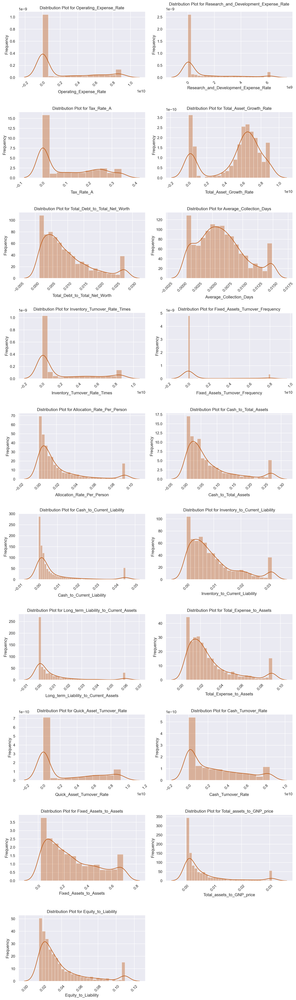

In [39]:
import math
# Calculate the number of rows and columns for the subplots
num_numerical_columns = len(predictors.columns)
num_rows = math.ceil(num_numerical_columns / 2)
num_cols = min(num_numerical_columns, 2)

# Create a figure with the dynamically calculated grid size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 4 * num_rows))

# Flatten the axes array if it's not already flattened
if num_rows > 1 and num_cols > 1:
    axes = axes.flatten()
elif num_rows == 1 or num_cols == 1:
    axes = [axes]
    # Loop through numerical columns
for i, column in enumerate(predictors.columns):
    sns.distplot(X[column], ax=axes[i], kde=True)
    axes[i].set_title(f'Distribution Plot for {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')
    axes[i].tick_params(axis='x', rotation=45)
    
# Remove any unused subplots
for j in range(num_numerical_columns, len(axes)):
    fig.delaxes(axes[j])

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.show()

<Figure size 4000x4000 with 0 Axes>

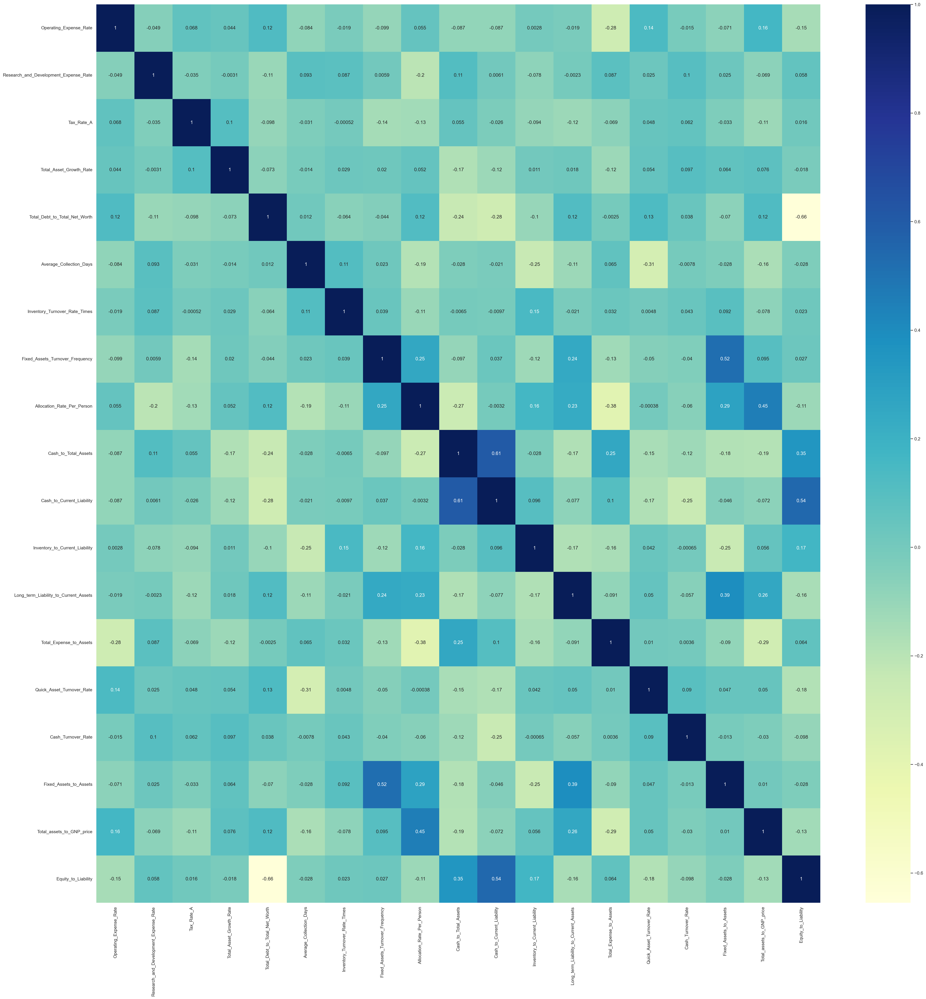

In [40]:
plt.figure(figsize=(40,40))
dataplot = sns.heatmap(predictors.corr(), cmap="YlGnBu", annot=True)
plt.show()

In [41]:
# Find pairs of columns with correlations above 0.7
highly_correlated_pairs = []
# Calculate the correlation matrix
correlation_matrix = predictors.corr()

# Iterate through the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.7:  # Adjust the threshold as needed
            colname1 = correlation_matrix.columns[i]
            colname2 = correlation_matrix.columns[j]
            correlation_value = correlation_matrix.iloc[i, j]
            highly_correlated_pairs.append((colname1, colname2, correlation_value))

# Print the highly correlated pairs
print("Highly correlated pairs with correlation above 0.7:")
for pair in highly_correlated_pairs:
    col1, col2, correlation = pair
    print(f"{col1} and {col2}: Correlation = {correlation:.2f}")

Highly correlated pairs with correlation above 0.7:


(array([1357.,   38.,   11.,   18.,   12.,   21.,   24.,   29.,   26.,
          33.,   17.,   27.,   41.,   46.,   39.,   40.,   40.,   36.,
          51.,  152.]),
 array([1.111270e-04, 4.485750e+08, 8.971500e+08, 1.345725e+09,
        1.794300e+09, 2.242875e+09, 2.691450e+09, 3.140025e+09,
        3.588600e+09, 4.037175e+09, 4.485750e+09, 4.934325e+09,
        5.382900e+09, 5.831475e+09, 6.280050e+09, 6.728625e+09,
        7.177200e+09, 7.625775e+09, 8.074350e+09, 8.522925e+09,
        8.971500e+09]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Operating_Expense_Rate')

Text(0.5, 0, 'Operating_Expense_Rate')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([1.11127e-04, 1.11127e-04, 1.11127e-04, ..., 8.97150e+09,
         8.97150e+09, 8.97150e+09])),
 (2585261917.1202497, 2024412402.3328424, 0.8095892196226774))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Operating_Expense_Rate')

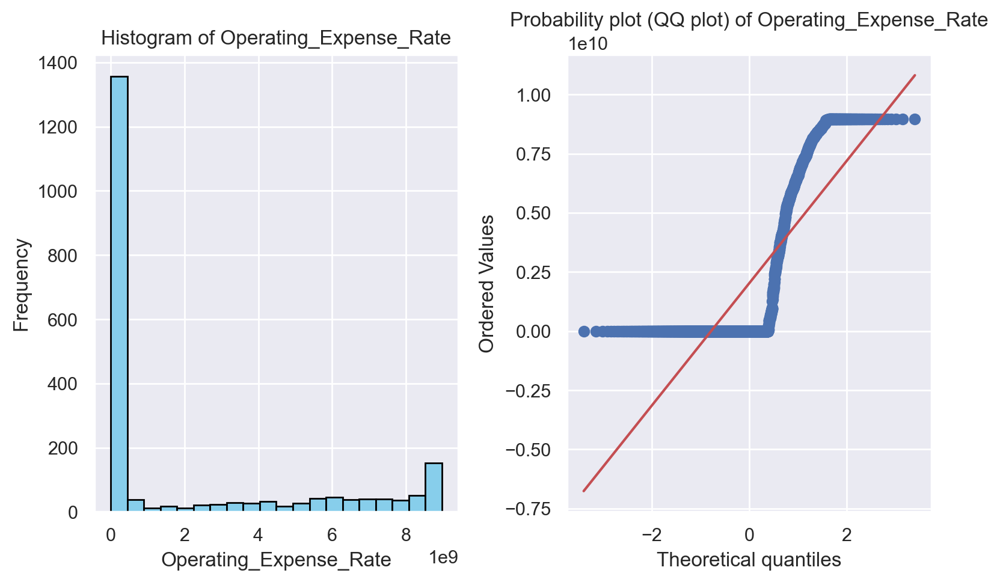

(array([1299.,   82.,   65.,   39.,   60.,   42.,   39.,   29.,   26.,
          37.,   27.,   38.,   28.,   24.,   34.,   17.,   20.,   22.,
          16.,  114.]),
 array([0.0000e+00, 3.1180e+08, 6.2360e+08, 9.3540e+08, 1.2472e+09,
        1.5590e+09, 1.8708e+09, 2.1826e+09, 2.4944e+09, 2.8062e+09,
        3.1180e+09, 3.4298e+09, 3.7416e+09, 4.0534e+09, 4.3652e+09,
        4.6770e+09, 4.9888e+09, 5.3006e+09, 5.6124e+09, 5.9242e+09,
        6.2360e+09]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Research_and_Development_Expense_Rate')

Text(0.5, 0, 'Research_and_Development_Expense_Rate')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([0.000e+00, 0.000e+00, 0.000e+00, ..., 6.236e+09, 6.236e+09,
         6.236e+09])),
 (1529614383.1672199, 1128341739.5530376, 0.8055708323171573))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Research_and_Development_Expense_Rate')

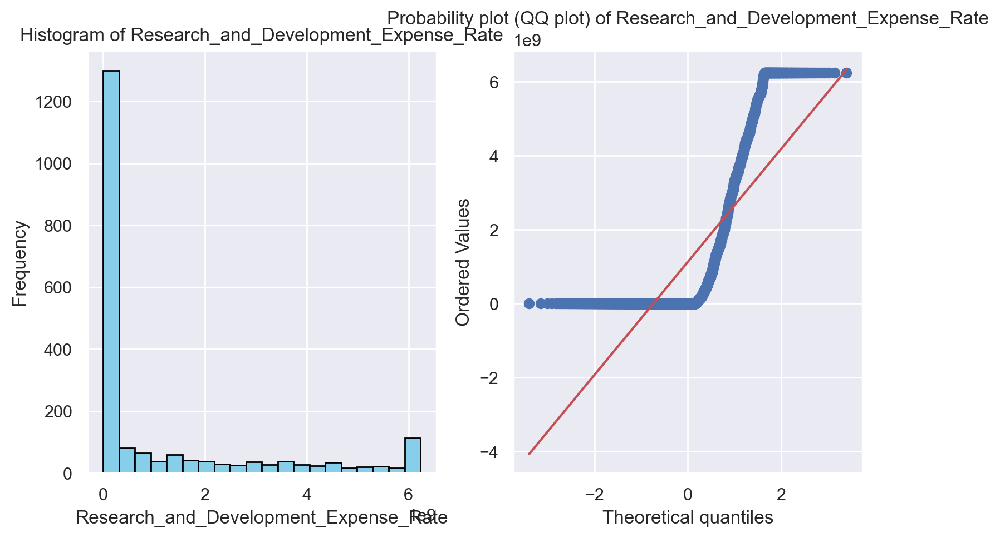

(array([967.,  54.,  45.,  36.,  45.,  52.,  49.,  52.,  44.,  45.,  44.,
         52.,  80.,  66.,  97.,  80.,  64.,  34.,  27., 125.]),
 array([0.        , 0.01708118, 0.03416236, 0.05124355, 0.06832473,
        0.08540591, 0.10248709, 0.11956828, 0.13664946, 0.15373064,
        0.17081182, 0.18789301, 0.20497419, 0.22205537, 0.23913655,
        0.25621773, 0.27329892, 0.2903801 , 0.30746128, 0.32454246,
        0.34162365]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Tax_Rate_A')

Text(0.5, 0, 'Tax_Rate_A')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([0.        , 0.        , 0.        , ..., 0.34162365, 0.34162365,
         0.34162365])),
 (0.10734182817259448, 0.10445332646066569, 0.894827508395287))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Tax_Rate_A')

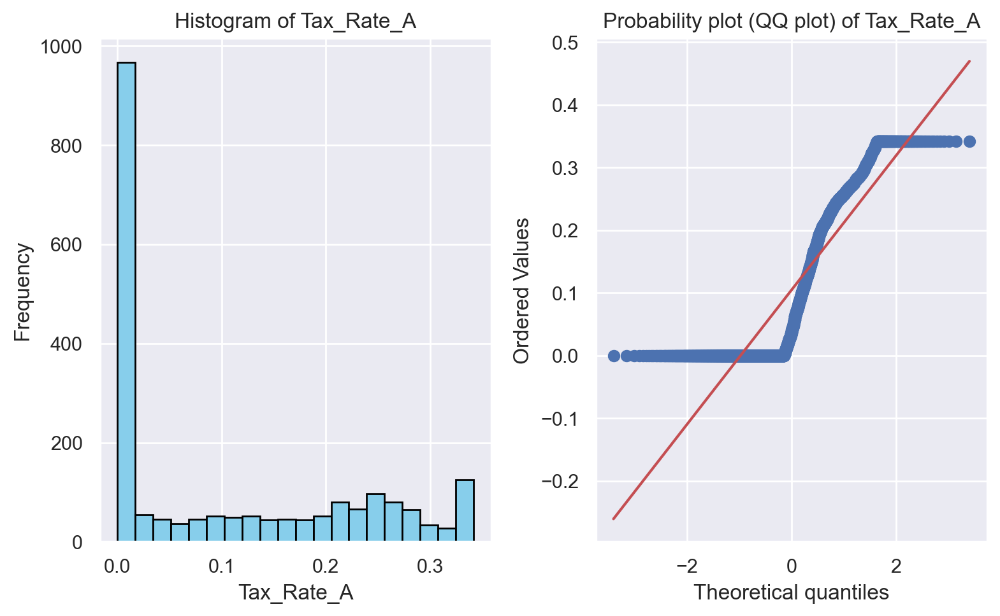

(array([289., 145.,  10.,   0.,   6.,   5.,  10.,  11.,  25.,  32.,  56.,
         84., 154., 236., 246., 213., 184., 116.,  74., 162.]),
 array([1.133856e-04, 4.490000e+08, 8.980000e+08, 1.347000e+09,
        1.796000e+09, 2.245000e+09, 2.694000e+09, 3.143000e+09,
        3.592000e+09, 4.041000e+09, 4.490000e+09, 4.939000e+09,
        5.388000e+09, 5.837000e+09, 6.286000e+09, 6.735000e+09,
        7.184000e+09, 7.633000e+09, 8.082000e+09, 8.531000e+09,
        8.980000e+09]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Total_Asset_Growth_Rate')

Text(0.5, 0, 'Total_Asset_Growth_Rate')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([1.133856e-04, 1.133856e-04, 1.133856e-04, ..., 8.980000e+09,
         8.980000e+09, 8.980000e+09])),
 (2644449888.9699683, 5266953830.417905, 0.9158378005254681))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Total_Asset_Growth_Rate')

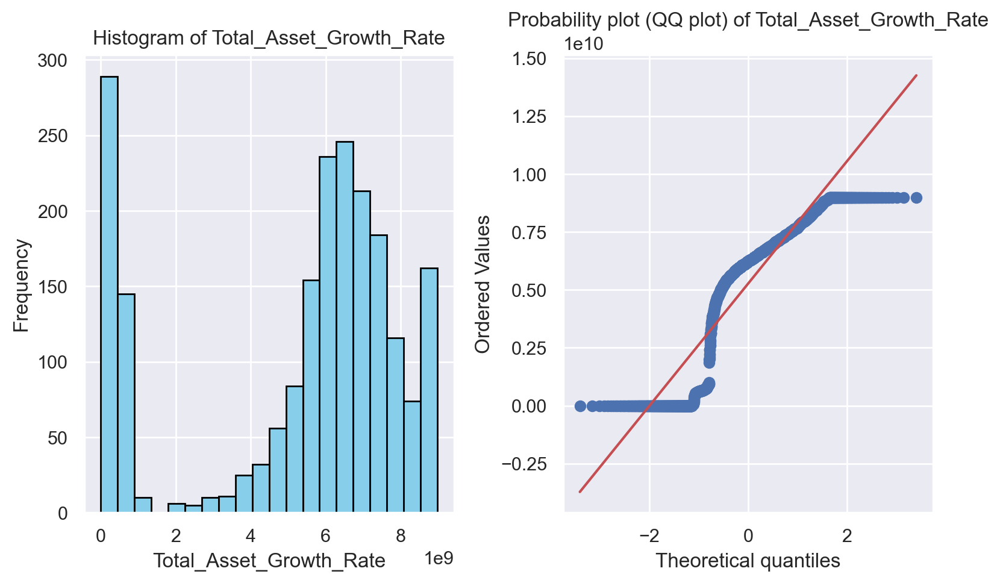

(array([292., 213., 200., 218., 170., 135., 122., 124.,  76.,  71.,  80.,
         48.,  39.,  46.,  29.,  29.,  22.,  19.,  16., 109.]),
 array([0.00125877, 0.00257486, 0.00389096, 0.00520705, 0.00652315,
        0.00783924, 0.00915534, 0.01047144, 0.01178753, 0.01310363,
        0.01441972, 0.01573582, 0.01705192, 0.01836801, 0.01968411,
        0.0210002 , 0.0223163 , 0.02363239, 0.02494849, 0.02626459,
        0.02758068]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Total_Debt_to_Total_Net_Worth')

Text(0.5, 0, 'Total_Debt_to_Total_Net_Worth')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([0.00125877, 0.00125877, 0.00125877, ..., 0.02758068, 0.02758068,
         0.02758068])),
 (0.006702558286343516, 0.009404449359523807, 0.9393974329554049))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Total_Debt_to_Total_Net_Worth')

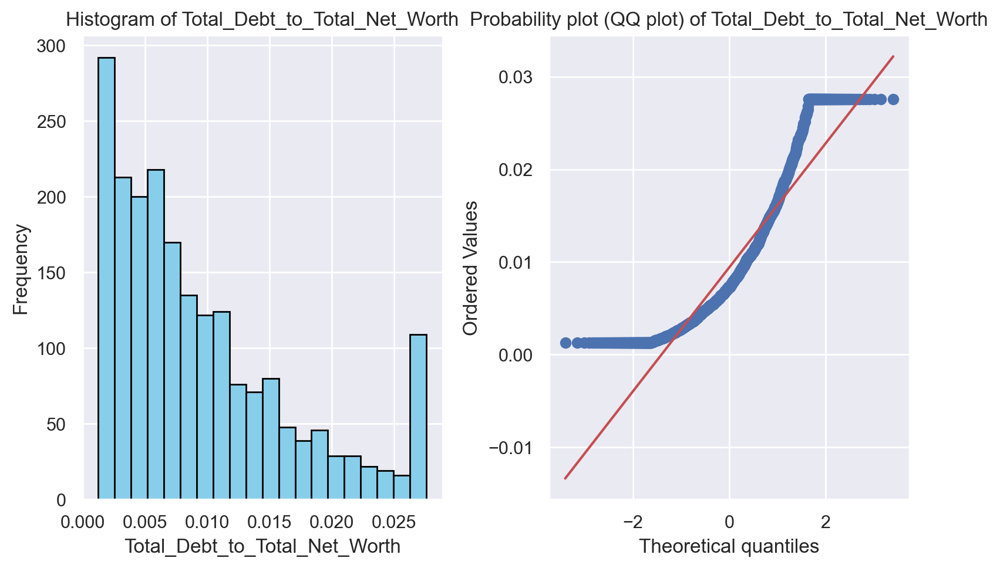

(array([198.,  98.,  95., 118., 140., 153., 145., 164., 143., 135., 122.,
        112.,  81.,  63.,  48.,  41.,  39.,  27.,  21., 115.]),
 array([0.00070909, 0.00141482, 0.00212055, 0.00282629, 0.00353202,
        0.00423776, 0.00494349, 0.00564923, 0.00635496, 0.0070607 ,
        0.00776643, 0.00847216, 0.0091779 , 0.00988363, 0.01058937,
        0.0112951 , 0.01200084, 0.01270657, 0.01341231, 0.01411804,
        0.01482377]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Average_Collection_Days')

Text(0.5, 0, 'Average_Collection_Days')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([0.00070909, 0.00070909, 0.00070909, ..., 0.01482377, 0.01482377,
         0.01482377])),
 (0.0036976171378044704, 0.006378429927988338, 0.9789836946856627))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Average_Collection_Days')

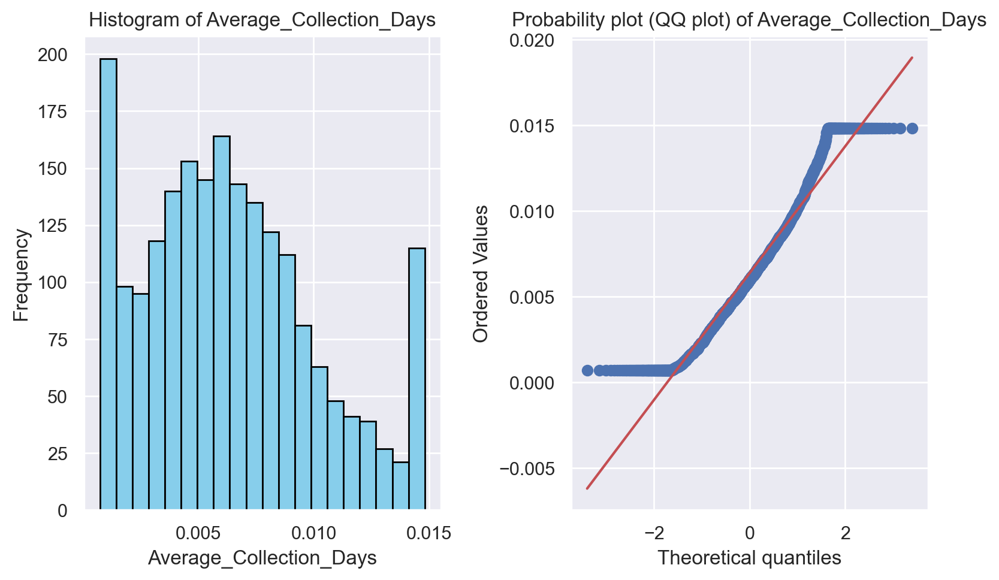

(array([1183.,  135.,   69.,   34.,   17.,   23.,   32.,   26.,   37.,
          25.,   42.,   36.,   37.,   31.,   24.,   33.,   36.,   42.,
          37.,  159.]),
 array([1.10440e-04, 4.35650e+08, 8.71300e+08, 1.30695e+09, 1.74260e+09,
        2.17825e+09, 2.61390e+09, 3.04955e+09, 3.48520e+09, 3.92085e+09,
        4.35650e+09, 4.79215e+09, 5.22780e+09, 5.66345e+09, 6.09910e+09,
        6.53475e+09, 6.97040e+09, 7.40605e+09, 7.84170e+09, 8.27735e+09,
        8.71300e+09]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Inventory_Turnover_Rate_Times')

Text(0.5, 0, 'Inventory_Turnover_Rate_Times')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([1.1044e-04, 1.1044e-04, 1.1044e-04, ..., 8.7130e+09, 8.7130e+09,
         8.7130e+09])),
 (2497345110.037998, 2000941059.281927, 0.8289558654990794))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Inventory_Turnover_Rate_Times')

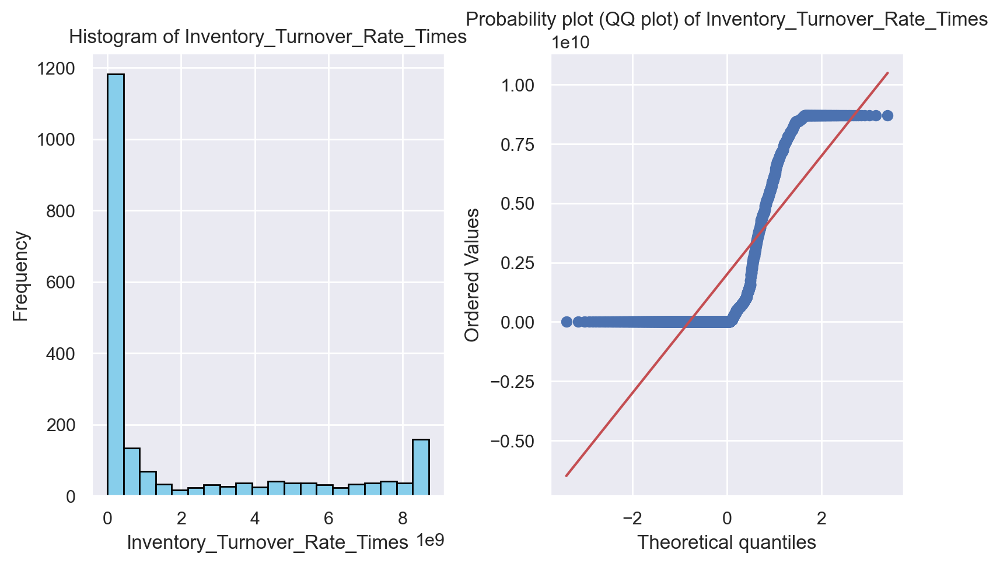

(array([1602.,   31.,   16.,    8.,   13.,   17.,   11.,   12.,   12.,
          17.,   18.,   21.,   15.,   22.,   25.,   20.,   25.,   18.,
          28.,  127.]),
 array([1.1877e-04, 4.0100e+08, 8.0200e+08, 1.2030e+09, 1.6040e+09,
        2.0050e+09, 2.4060e+09, 2.8070e+09, 3.2080e+09, 3.6090e+09,
        4.0100e+09, 4.4110e+09, 4.8120e+09, 5.2130e+09, 5.6140e+09,
        6.0150e+09, 6.4160e+09, 6.8170e+09, 7.2180e+09, 7.6190e+09,
        8.0200e+09]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Fixed_Assets_Turnover_Frequency')

Text(0.5, 0, 'Fixed_Assets_Turnover_Frequency')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([1.1877e-04, 1.1877e-04, 1.1877e-04, ..., 8.0200e+09, 8.0200e+09,
         8.0200e+09])),
 (1803944090.2338827, 1179586005.8322072, 0.7208944198654461))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Fixed_Assets_Turnover_Frequency')

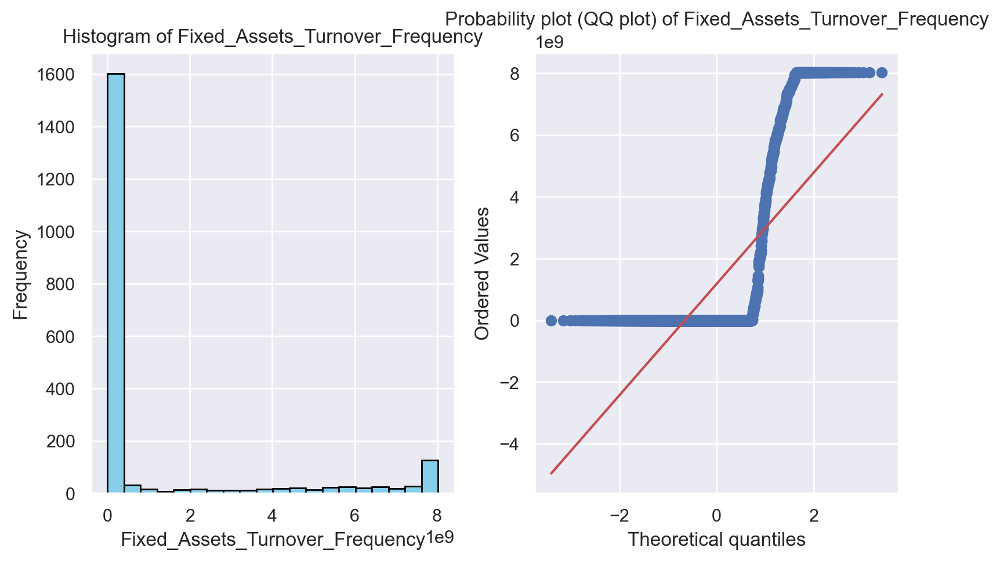

(array([621., 377., 254., 168., 113.,  82.,  69.,  54.,  49.,  32.,  25.,
         21.,  20.,  14.,  10.,  10.,   9.,  10.,   6., 114.]),
 array([0.00094012, 0.00561837, 0.01029662, 0.01497487, 0.01965312,
        0.02433137, 0.02900963, 0.03368788, 0.03836613, 0.04304438,
        0.04772263, 0.05240088, 0.05707913, 0.06175738, 0.06643563,
        0.07111389, 0.07579214, 0.08047039, 0.08514864, 0.08982689,
        0.09450514]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Allocation_Rate_Per_Person')

Text(0.5, 0, 'Allocation_Rate_Per_Person')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([0.00094012, 0.00094012, 0.00094012, ..., 0.09450514, 0.09450514,
         0.09450514])),
 (0.02063912981145964, 0.020233861890719136, 0.8511269538644045))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Allocation_Rate_Per_Person')

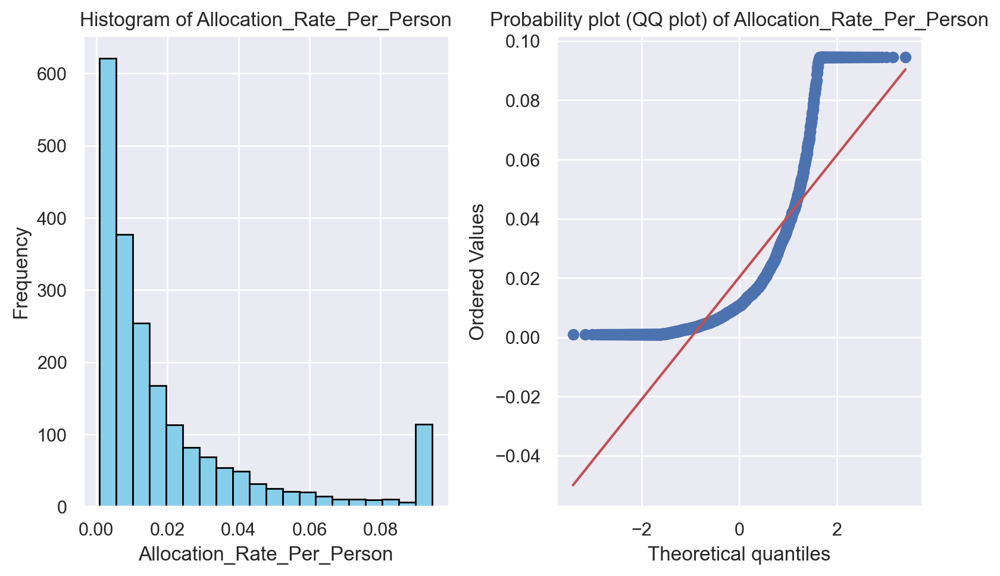

(array([441., 309., 228., 256., 142., 105.,  90.,  71.,  55.,  38.,  38.,
         37.,  26.,  23.,  24.,  17.,   9.,  16.,  13., 120.]),
 array([0.00550474, 0.01877547, 0.03204621, 0.04531694, 0.05858767,
        0.07185841, 0.08512914, 0.09839988, 0.11167061, 0.12494134,
        0.13821208, 0.15148281, 0.16475354, 0.17802428, 0.19129501,
        0.20456575, 0.21783648, 0.23110721, 0.24437795, 0.25764868,
        0.27091942]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Cash_to_Total_Assets')

Text(0.5, 0, 'Cash_to_Total_Assets')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([0.00550474, 0.00550474, 0.00550474, ..., 0.27091942, 0.27091942,
         0.27091942])),
 (0.06424421024552775, 0.07204476588114672, 0.8912598138814218))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Cash_to_Total_Assets')

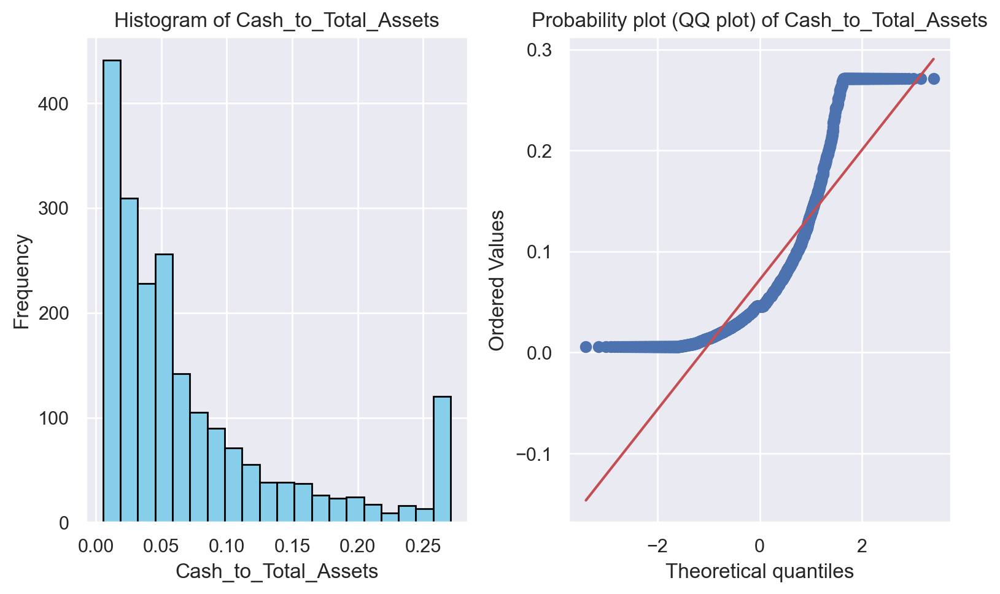

(array([983., 359., 179., 105.,  66.,  56.,  40.,  29.,  32.,  21.,  16.,
         16.,   8.,  12.,   6.,   4.,   4.,   5.,   4., 113.]),
 array([0.0002872 , 0.00252342, 0.00475964, 0.00699586, 0.00923208,
        0.0114683 , 0.01370452, 0.01594074, 0.01817696, 0.02041318,
        0.0226494 , 0.02488562, 0.02712184, 0.02935806, 0.03159427,
        0.03383049, 0.03606671, 0.03830293, 0.04053915, 0.04277537,
        0.04501159]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Cash_to_Current_Liability')

Text(0.5, 0, 'Cash_to_Current_Liability')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([0.0002872 , 0.0002872 , 0.0002872 , ..., 0.04501159, 0.04501159,
         0.04501159])),
 (0.00884898973527733, 0.007314393603328471, 0.786177551563542))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Cash_to_Current_Liability')

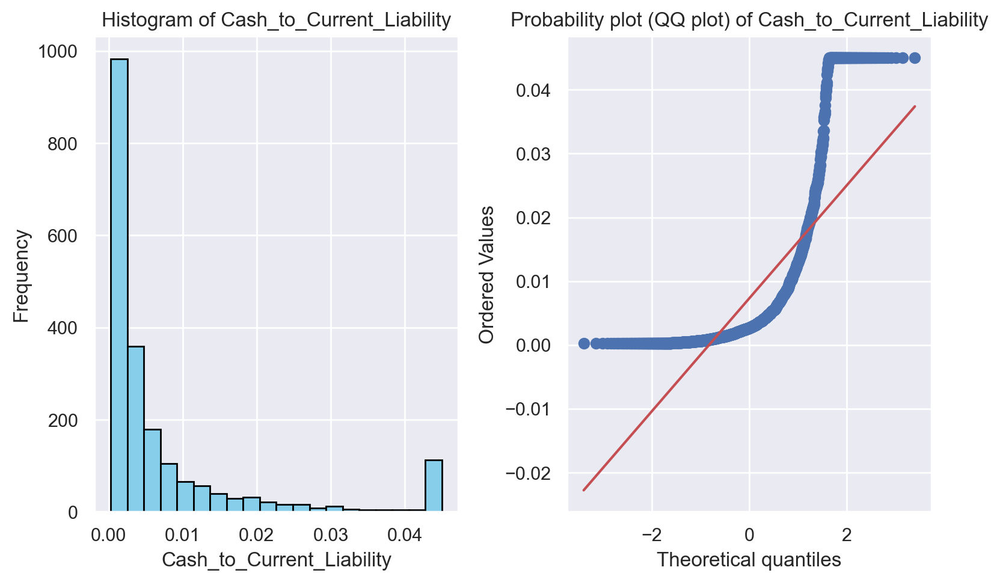

(array([327., 213., 225., 205., 191., 137., 132., 103.,  73.,  62.,  31.,
         54.,  48.,  44.,  37.,  22.,  21.,   9.,  11., 113.]),
 array([0.        , 0.0015687 , 0.0031374 , 0.0047061 , 0.00627481,
        0.00784351, 0.00941221, 0.01098091, 0.01254961, 0.01411831,
        0.01568702, 0.01725572, 0.01882442, 0.02039312, 0.02196182,
        0.02353052, 0.02509923, 0.02666793, 0.02823663, 0.02980533,
        0.03137403]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Inventory_to_Current_Liability')

Text(0.5, 0, 'Inventory_to_Current_Liability')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([0.        , 0.        , 0.        , ..., 0.03137403, 0.03137403,
         0.03137403])),
 (0.00787399797548119, 0.009235099548688043, 0.9305991651641289))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Inventory_to_Current_Liability')

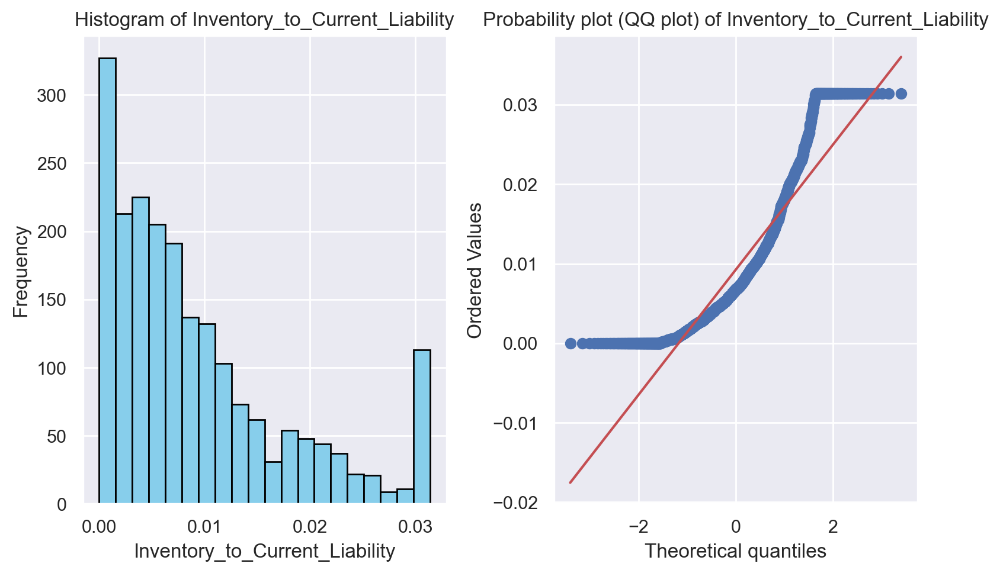

(array([1069.,  238.,  173.,  121.,   89.,   58.,   41.,   39.,   26.,
          19.,   11.,   10.,   14.,   17.,    8.,    5.,    3.,    6.,
           3.,  108.]),
 array([0.        , 0.00301928, 0.00603856, 0.00905783, 0.01207711,
        0.01509639, 0.01811567, 0.02113495, 0.02415423, 0.0271735 ,
        0.03019278, 0.03321206, 0.03623134, 0.03925062, 0.0422699 ,
        0.04528917, 0.04830845, 0.05132773, 0.05434701, 0.05736629,
        0.06038557]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Long_term_Liability_to_Current_Assets')

Text(0.5, 0, 'Long_term_Liability_to_Current_Assets')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([0.        , 0.        , 0.        , ..., 0.06038557, 0.06038557,
         0.06038557])),
 (0.012132480600511327, 0.009149322634353736, 0.7940134068168395))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Long_term_Liability_to_Current_Assets')

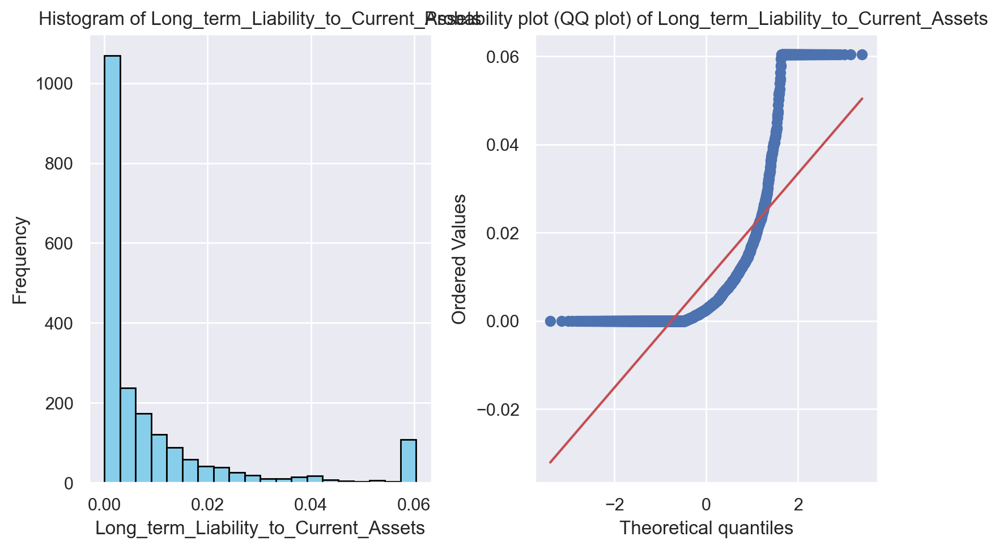

(array([365., 247., 280., 236., 189., 134., 103.,  78.,  66.,  35.,  49.,
         39.,  23.,  27.,  23.,  20.,   8.,  12.,  12., 112.]),
 array([0.00572522, 0.01002999, 0.01433477, 0.01863955, 0.02294432,
        0.0272491 , 0.03155387, 0.03585865, 0.04016343, 0.0444682 ,
        0.04877298, 0.05307776, 0.05738253, 0.06168731, 0.06599208,
        0.07029686, 0.07460164, 0.07890641, 0.08321119, 0.08751597,
        0.09182074]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Total_Expense_to_Assets')

Text(0.5, 0, 'Total_Expense_to_Assets')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([0.00572522, 0.00572522, 0.00572522, ..., 0.09182074, 0.09182074,
         0.09182074])),
 (0.020398348693757323, 0.028327649136710393, 0.9041737741499439))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Total_Expense_to_Assets')

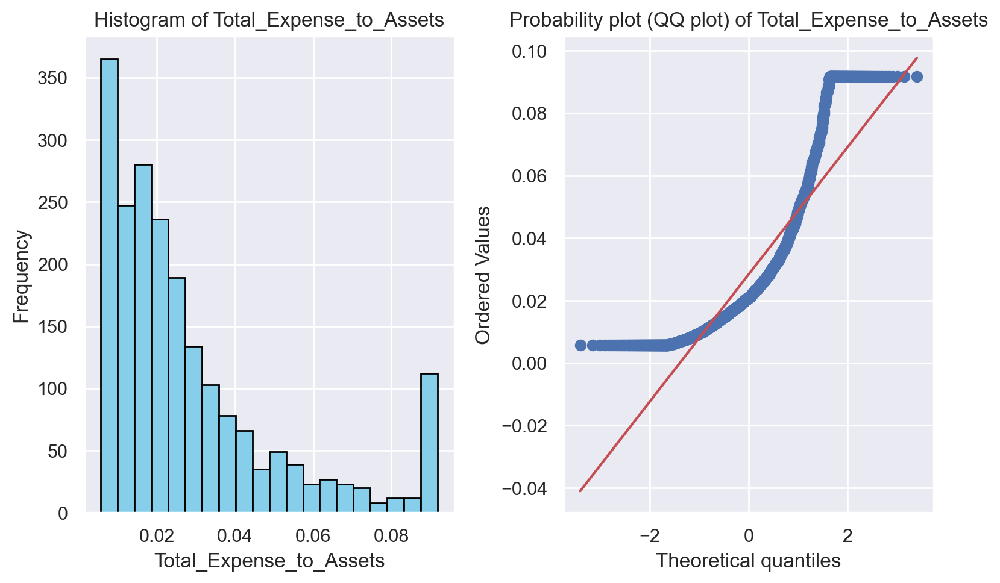

(array([1184.,   50.,   25.,   12.,   18.,   19.,   30.,   26.,   28.,
          43.,   30.,   43.,   55.,   51.,   58.,   50.,   54.,   60.,
          66.,  156.]),
 array([1.088617e-04, 4.580000e+08, 9.160000e+08, 1.374000e+09,
        1.832000e+09, 2.290000e+09, 2.748000e+09, 3.206000e+09,
        3.664000e+09, 4.122000e+09, 4.580000e+09, 5.038000e+09,
        5.496000e+09, 5.954000e+09, 6.412000e+09, 6.870000e+09,
        7.328000e+09, 7.786000e+09, 8.244000e+09, 8.702000e+09,
        9.160000e+09]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Quick_Asset_Turnover_Rate')

Text(0.5, 0, 'Quick_Asset_Turnover_Rate')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([1.088617e-04, 1.088617e-04, 1.088617e-04, ..., 9.160000e+09,
         9.160000e+09, 9.160000e+09])),
 (2904327312.9647746, 2551228328.474729, 0.850068428889529))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Quick_Asset_Turnover_Rate')

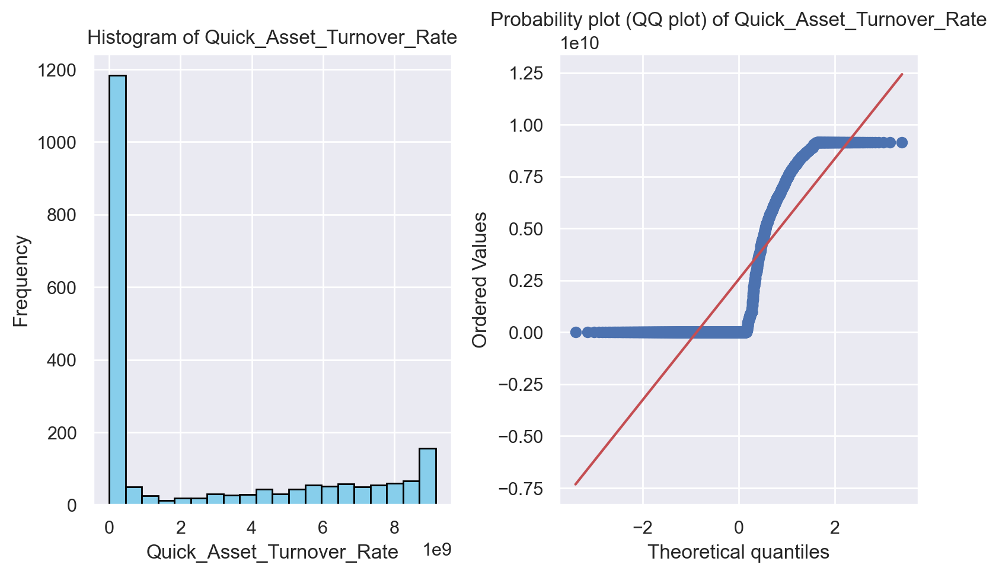

(array([680., 136., 112.,  90.,  94.,  94.,  74.,  90.,  56.,  71.,  59.,
         59.,  57.,  45.,  54.,  43.,  38.,  28.,  37., 141.]),
 array([1.20604e-04, 4.20800e+08, 8.41600e+08, 1.26240e+09, 1.68320e+09,
        2.10400e+09, 2.52480e+09, 2.94560e+09, 3.36640e+09, 3.78720e+09,
        4.20800e+09, 4.62880e+09, 5.04960e+09, 5.47040e+09, 5.89120e+09,
        6.31200e+09, 6.73280e+09, 7.15360e+09, 7.57440e+09, 7.99520e+09,
        8.41600e+09]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Cash_Turnover_Rate')

Text(0.5, 0, 'Cash_Turnover_Rate')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([1.20604e-04, 1.20604e-04, 1.20604e-04, ..., 8.41600e+09,
         8.41600e+09, 8.41600e+09])),
 (2524911834.7437153, 2613495349.8547683, 0.9238240880137139))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Cash_Turnover_Rate')

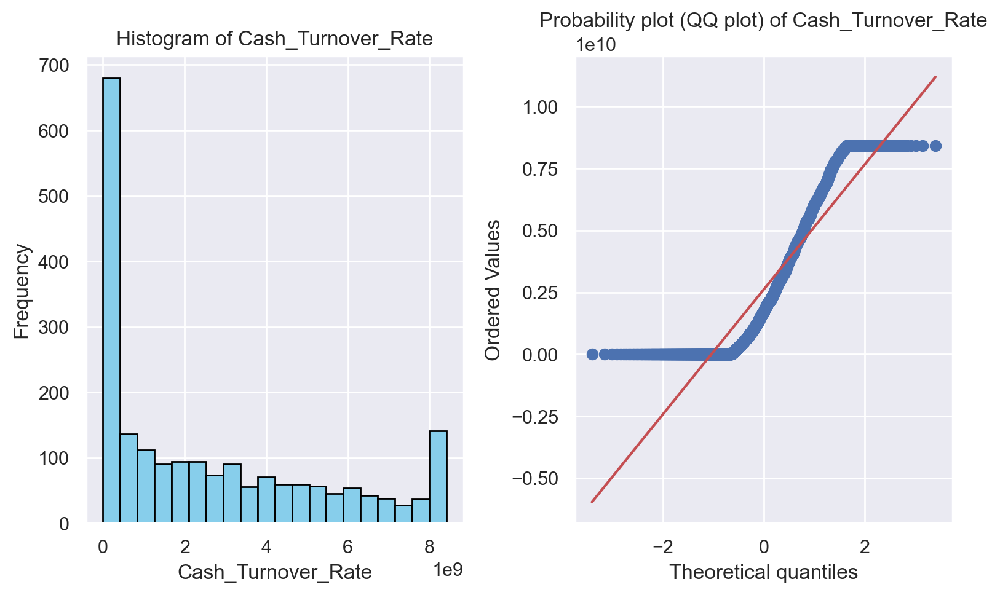

(array([300., 175., 167., 160., 137., 124., 108., 118.,  74.,  72.,  56.,
         72.,  59.,  64.,  53.,  44.,  45.,  47.,  47., 136.]),
 array([0.02138893, 0.05502013, 0.08865133, 0.12228253, 0.15591372,
        0.18954492, 0.22317612, 0.25680731, 0.29043851, 0.32406971,
        0.35770091, 0.3913321 , 0.4249633 , 0.4585945 , 0.49222569,
        0.52585689, 0.55948809, 0.59311928, 0.62675048, 0.66038168,
        0.69401288]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Fixed_Assets_to_Assets')

Text(0.5, 0, 'Fixed_Assets_to_Assets')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([0.02138893, 0.02138893, 0.02138893, ..., 0.69401288, 0.69401288,
         0.69401288])),
 (0.1953526656270084, 0.2683630812251943, 0.951871366835274))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Fixed_Assets_to_Assets')

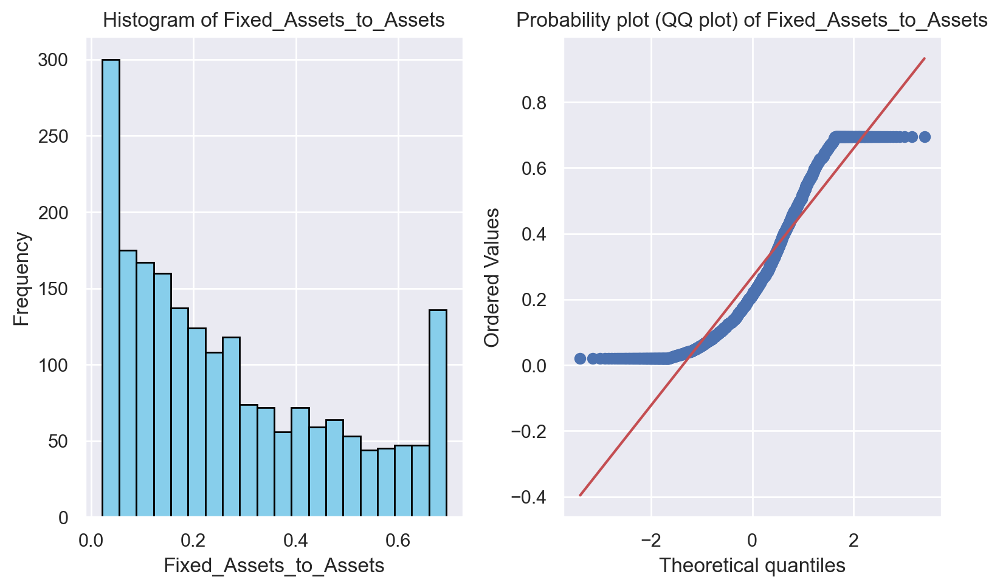

(array([870., 306., 173., 148., 109.,  59.,  54.,  44.,  38.,  17.,  19.,
         14.,  18.,  14.,  13.,  14.,  12.,  13.,  10., 113.]),
 array([0.00031085, 0.00183804, 0.00336523, 0.00489242, 0.0064196 ,
        0.00794679, 0.00947398, 0.01100117, 0.01252836, 0.01405555,
        0.01558273, 0.01710992, 0.01863711, 0.0201643 , 0.02169149,
        0.02321868, 0.02474586, 0.02627305, 0.02780024, 0.02932743,
        0.03085462]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Total_assets_to_GNP_price')

Text(0.5, 0, 'Total_assets_to_GNP_price')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([0.00031085, 0.00031085, 0.00031085, ..., 0.03085462, 0.03085462,
         0.03085462])),
 (0.006776524542197166, 0.006041747175607382, 0.8287188186728563))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Total_assets_to_GNP_price')

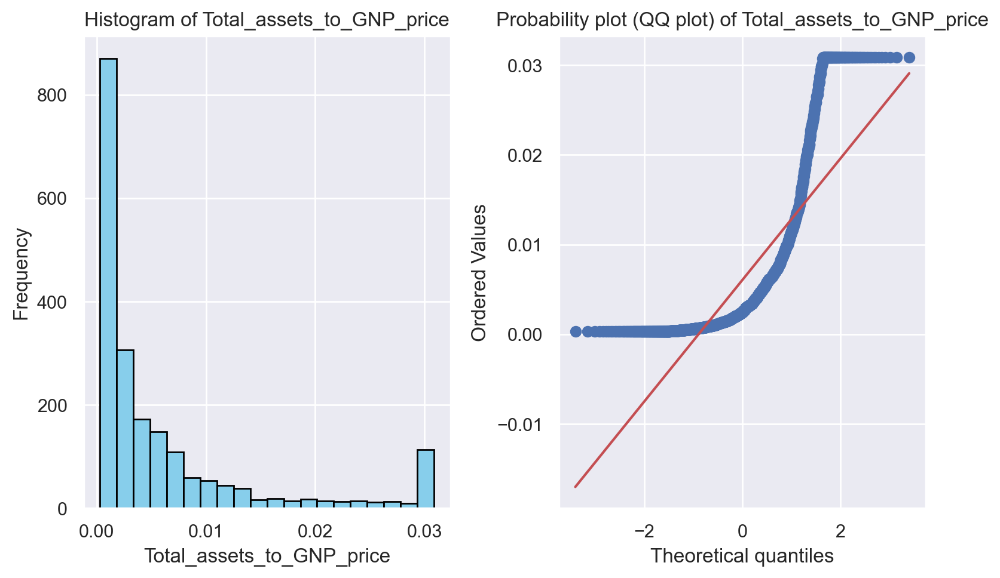

(array([480., 356., 249., 202., 165.,  93.,  80.,  64.,  47.,  42.,  33.,
         25.,  29.,  19.,  18.,  20.,   6.,  10.,   7., 113.]),
 array([0.01523601, 0.01995775, 0.02467949, 0.02940123, 0.03412297,
        0.03884472, 0.04356646, 0.0482882 , 0.05300994, 0.05773168,
        0.06245343, 0.06717517, 0.07189691, 0.07661865, 0.08134039,
        0.08606213, 0.09078388, 0.09550562, 0.10022736, 0.1049491 ,
        0.10967084]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Histogram of Equity_to_Liability')

Text(0.5, 0, 'Equity_to_Liability')

Text(0, 0.5, 'Frequency')

((array([-3.40014593, -3.14962659, -3.01070288, ...,  3.01070288,
          3.14962659,  3.40014593]),
  array([0.01523601, 0.01523601, 0.01523601, ..., 0.10967084, 0.10967084,
         0.10967084])),
 (0.021716850013580428, 0.03718809971569484, 0.8785522668202586))

Text(0.5, 1.0, 'Probability plot (QQ plot) of Equity_to_Liability')

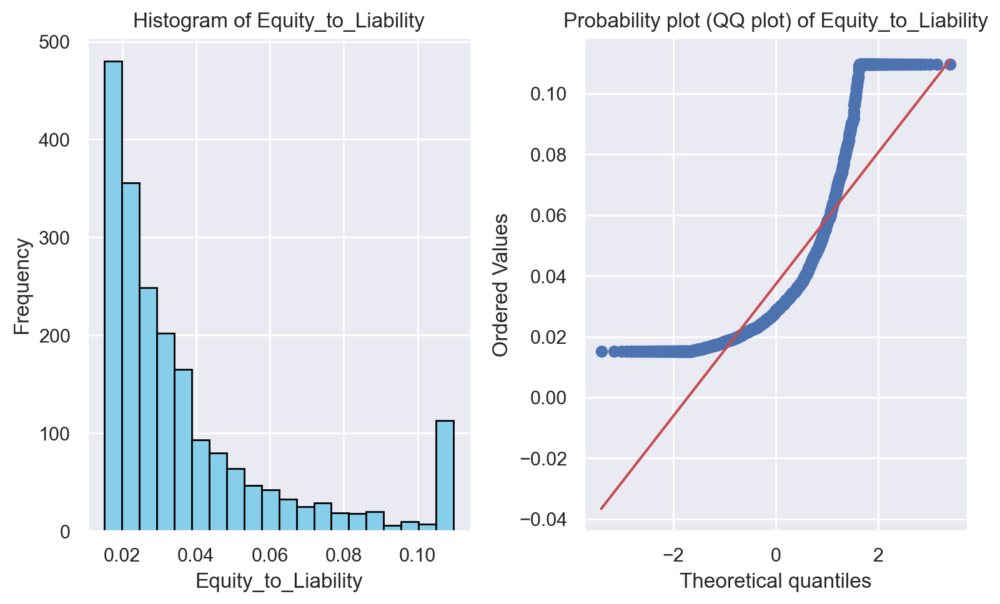

In [42]:
import matplotlib.pyplot as plt
import scipy.stats as stats

# List of column names
columns_to_plot = predictors.columns.tolist()

# Plot histograms and probability plots for each column
for column in columns_to_plot:
    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(8, 5))
    
    # Histogram
    axes[0].hist(predictors[column], bins=20, color='skyblue', edgecolor='black')
    axes[0].set_title(f'Histogram of {column}')
    axes[0].set_xlabel(column)
    axes[0].set_ylabel('Frequency')
    axes[0].grid(True)
    
    # Probability plot (QQ plot)
    stats.probplot(predictors[column], dist="norm", plot=axes[1])
    axes[1].set_title(f'Probability plot (QQ plot) of {column}')
    axes[1].grid(True)
    
    plt.tight_layout()
    plt.show()


## Bivariate Analysis

In [43]:
from scipy.stats import ttest_ind

# Split data into default and non-default groups based on the target variable
default_group = X[X['Default'] == 1]
non_default_group = X[X['Default'] == 0]

# Perform t-test for each numerical predictor variable
ttest_results = {}
for column in predictors.columns:
    if column != 'Default' and predictors[column].dtype == 'float64':  # Exclude the target variable and non-numerical columns
        t_statistic, p_value = ttest_ind(default_group[column], non_default_group[column])
        ttest_results[column] = {'t-statistic': t_statistic, 'p-value': p_value}

# Display t-test results
for column, result in ttest_results.items():
    print(f"{column}: t-statistic = {result['t-statistic']}, p-value = {result['p-value']}")


Operating_Expense_Rate: t-statistic = -0.8187751926585504, p-value = 0.4130095771160034
Research_and_Development_Expense_Rate: t-statistic = 2.956515903074883, p-value = 0.0031467976120231477
Tax_Rate_A: t-statistic = -10.578155452204072, p-value = 1.6793637975937928e-25
Total_Asset_Growth_Rate: t-statistic = -2.5515243518899893, p-value = 0.010797095988987367
Total_Debt_to_Total_Net_Worth: t-statistic = 16.64279408466645, p-value = 1.9111259571655774e-58
Average_Collection_Days: t-statistic = 5.292164536856991, p-value = 1.3374912055137123e-07
Inventory_Turnover_Rate_Times: t-statistic = 0.4635625855497727, p-value = 0.6430102344271063
Fixed_Assets_Turnover_Frequency: t-statistic = 4.601600230116802, p-value = 4.448194153106025e-06
Allocation_Rate_Per_Person: t-statistic = 3.4604093507560285, p-value = 0.0005503606367257286
Cash_to_Total_Assets: t-statistic = -5.474466466413909, p-value = 4.924641330303617e-08
Cash_to_Current_Liability: t-statistic = -2.3842953443480734, p-value = 0.0

In [44]:
# Group the dataframe by the 'Default' variable
grouped = X.groupby(target)

# Loop through each column in X and compute statistics for each group
for column in X.columns:
    print(f"Summary statistics for '{column}':")
    for group_name, group_data in grouped[column]:
        print(f"Default: {group_name}")
        print(group_data.describe())
        print("\n")


Summary statistics for 'Operating_Expense_Rate':
Default: 0.0
count         1838.00
mean    2044329284.00
std     3189670508.08
min              0.00
25%              0.00
50%              0.00
75%     4137500000.00
max     8971500000.00
Name: Operating_Expense_Rate, dtype: float64


Default: 1.0
count          220.00
mean    1858015909.09
std     3189321789.67
min              0.00
25%              0.00
50%              0.00
75%     2932500000.00
max     8971500000.00
Name: Operating_Expense_Rate, dtype: float64


Summary statistics for 'Research_and_Development_Expense_Rate':
Default: 0.0
count         1838.00
mean    1085661697.50
std     1863731161.66
min              0.00
25%              0.00
50%              0.00
75%     1490000000.00
max     6236000000.00
Name: Research_and_Development_Expense_Rate, dtype: float64


Default: 1.0
count          220.00
mean    1484914090.91
std     2121880006.08
min              0.00
25%              0.00
50%      154500000.00
75%     2662500000.

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Operating_Expense_Rate'>

Text(0.5, 1.0, 'Violin Plot of Operating_Expense_Rate by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Operating_Expense_Rate')

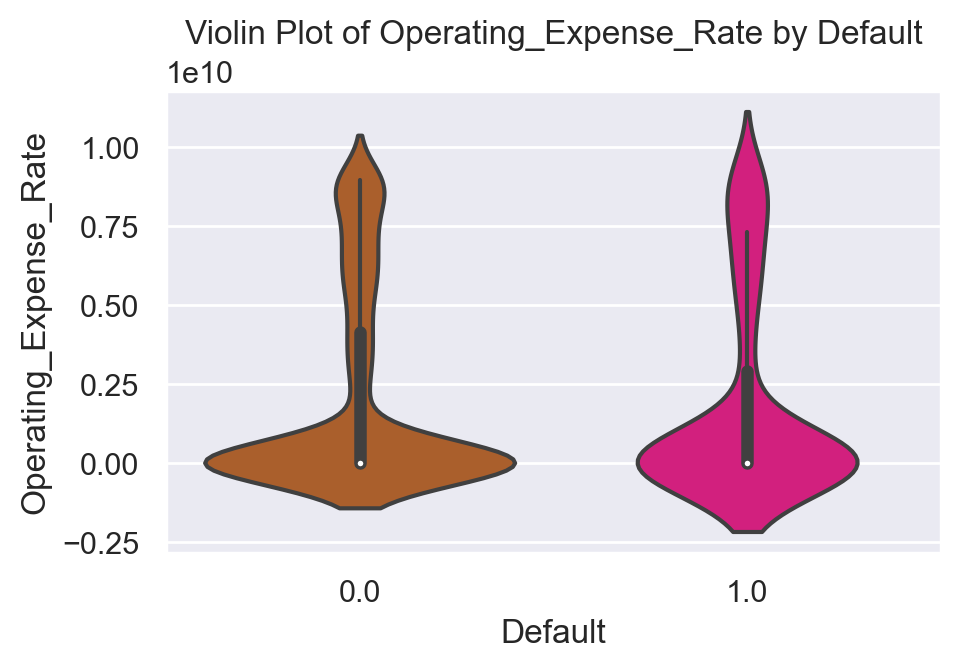

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Research_and_Development_Expense_Rate'>

Text(0.5, 1.0, 'Violin Plot of Research_and_Development_Expense_Rate by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Research_and_Development_Expense_Rate')

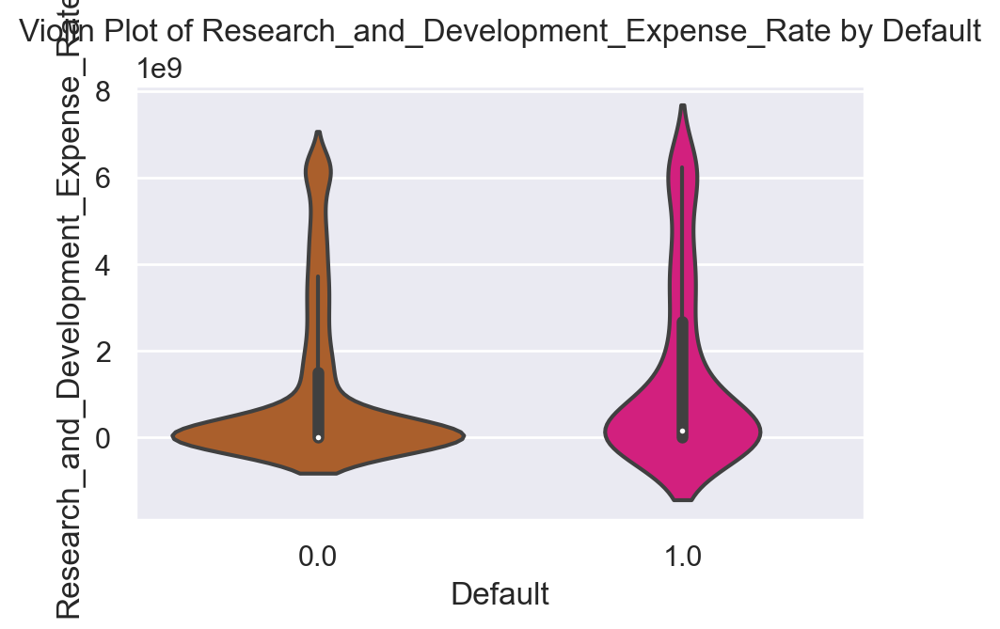

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Tax_Rate_A'>

Text(0.5, 1.0, 'Violin Plot of Tax_Rate_A by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Tax_Rate_A')

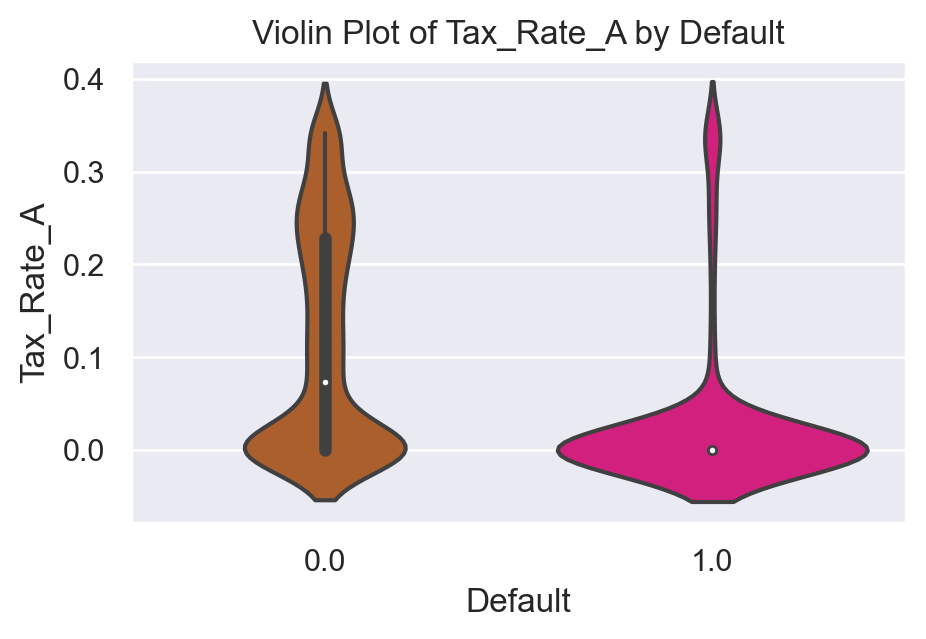

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Total_Asset_Growth_Rate'>

Text(0.5, 1.0, 'Violin Plot of Total_Asset_Growth_Rate by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Total_Asset_Growth_Rate')

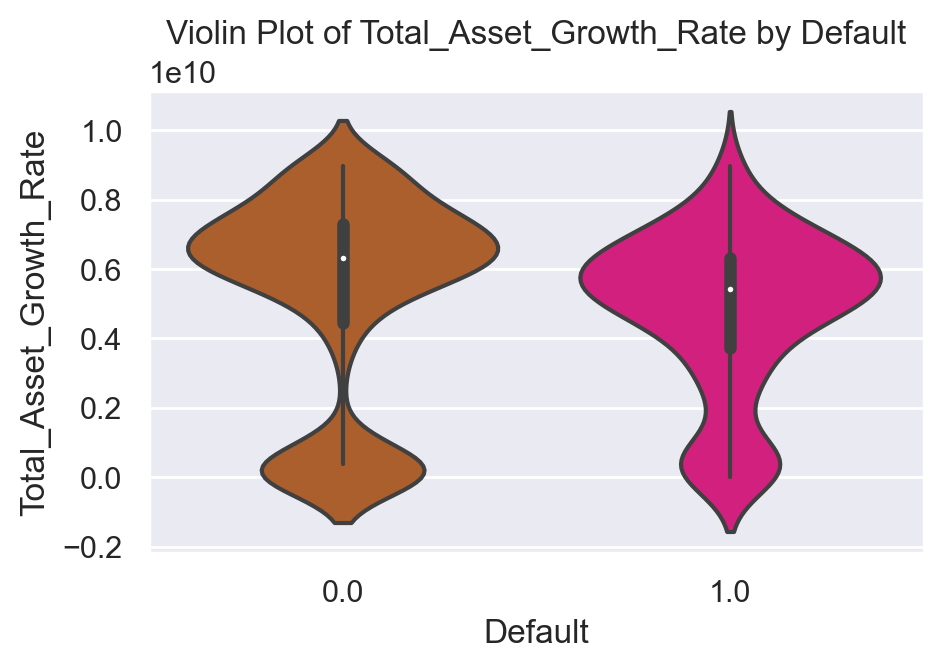

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Total_Debt_to_Total_Net_Worth'>

Text(0.5, 1.0, 'Violin Plot of Total_Debt_to_Total_Net_Worth by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Total_Debt_to_Total_Net_Worth')

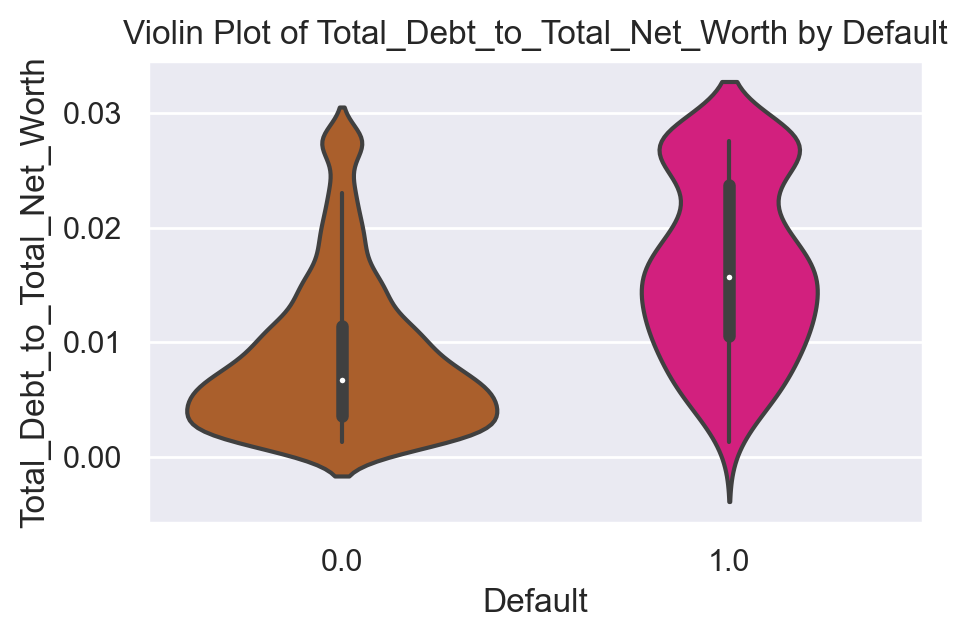

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Average_Collection_Days'>

Text(0.5, 1.0, 'Violin Plot of Average_Collection_Days by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Average_Collection_Days')

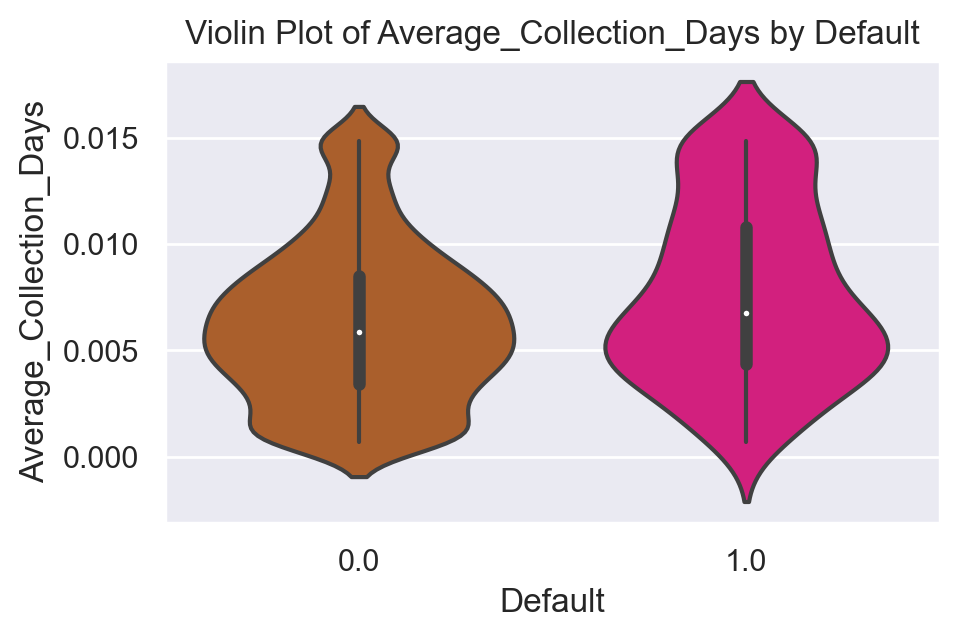

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Inventory_Turnover_Rate_Times'>

Text(0.5, 1.0, 'Violin Plot of Inventory_Turnover_Rate_Times by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Inventory_Turnover_Rate_Times')

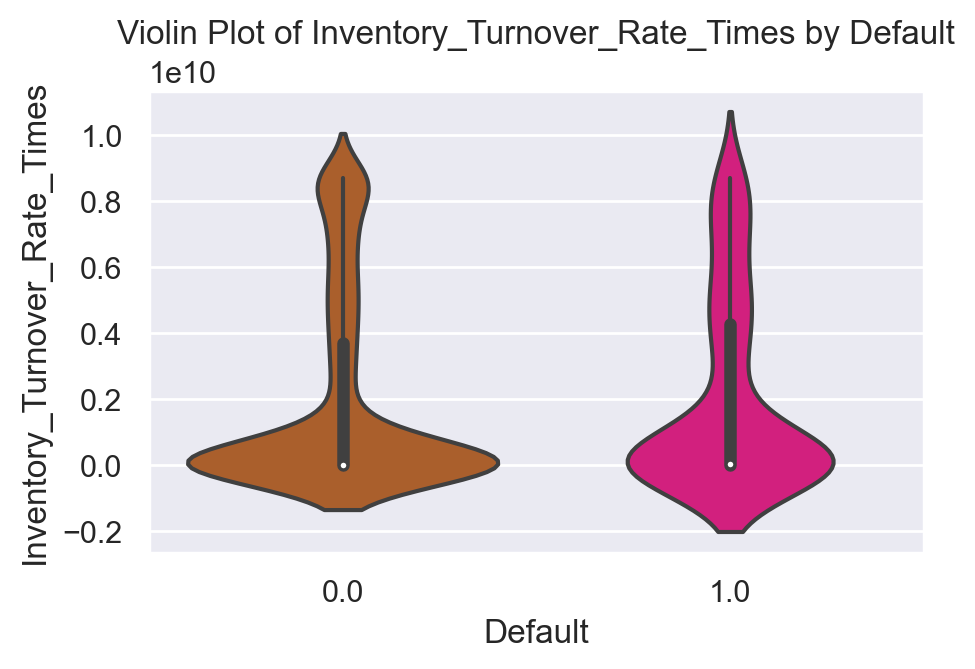

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Fixed_Assets_Turnover_Frequency'>

Text(0.5, 1.0, 'Violin Plot of Fixed_Assets_Turnover_Frequency by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Fixed_Assets_Turnover_Frequency')

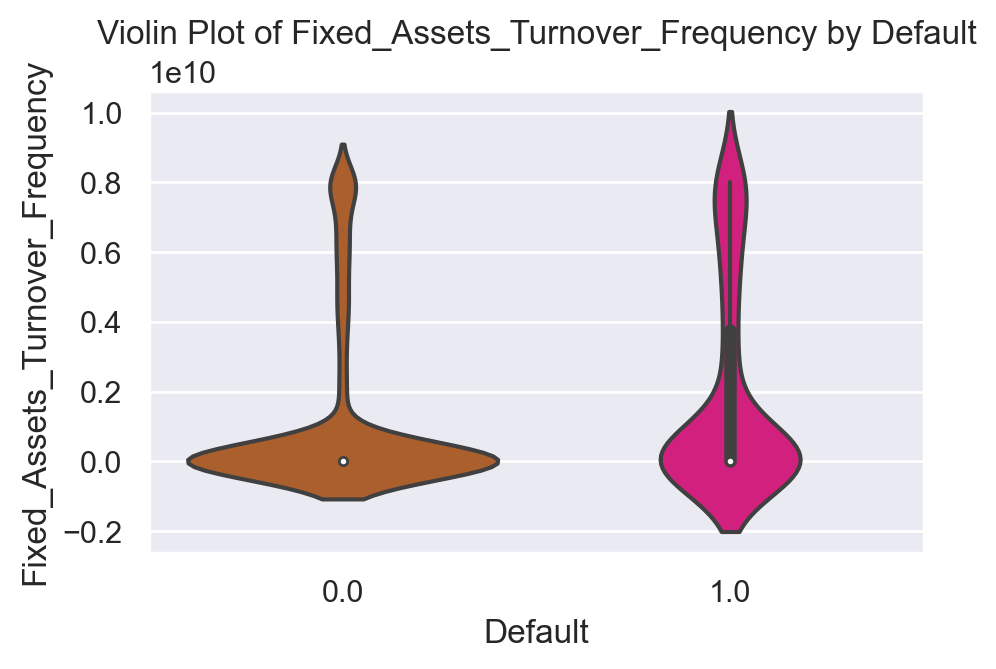

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Allocation_Rate_Per_Person'>

Text(0.5, 1.0, 'Violin Plot of Allocation_Rate_Per_Person by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Allocation_Rate_Per_Person')

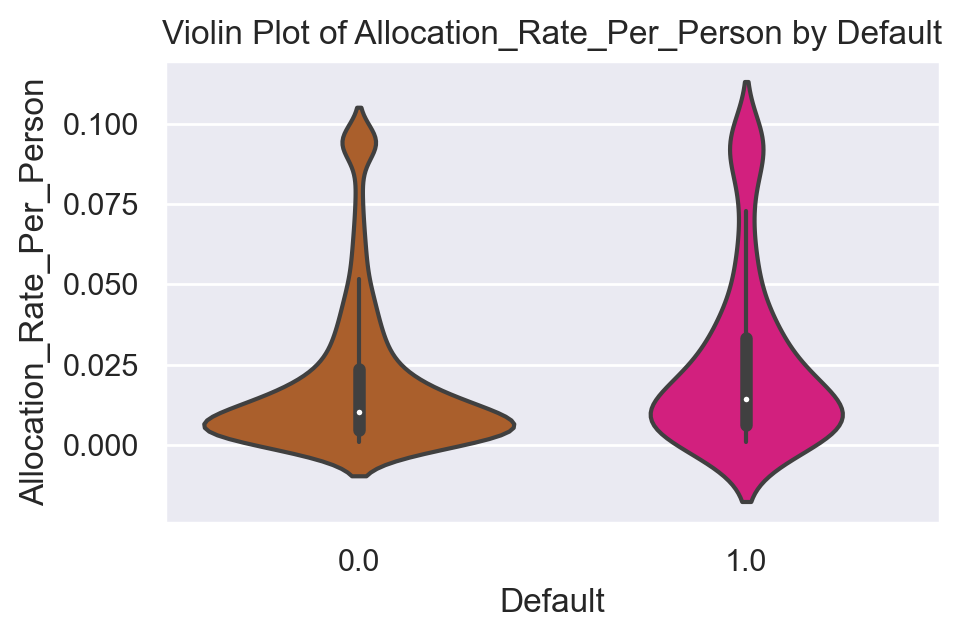

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Cash_to_Total_Assets'>

Text(0.5, 1.0, 'Violin Plot of Cash_to_Total_Assets by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Cash_to_Total_Assets')

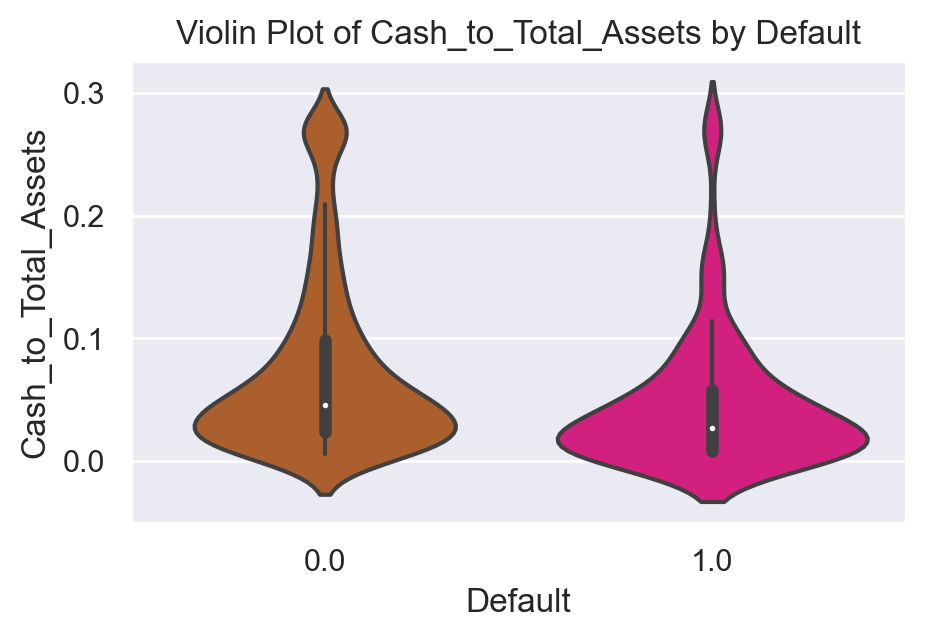

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Cash_to_Current_Liability'>

Text(0.5, 1.0, 'Violin Plot of Cash_to_Current_Liability by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Cash_to_Current_Liability')

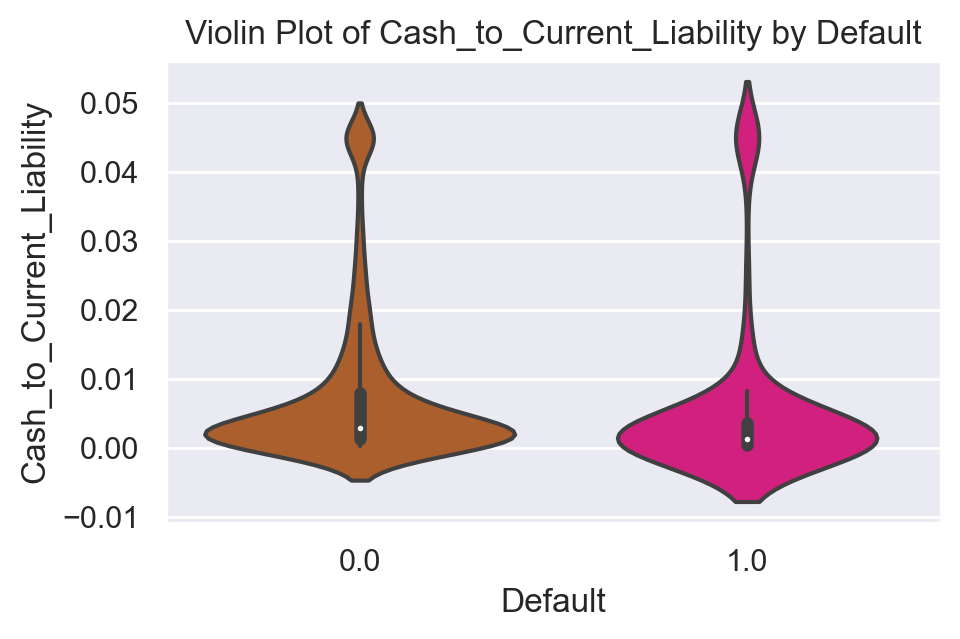

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Inventory_to_Current_Liability'>

Text(0.5, 1.0, 'Violin Plot of Inventory_to_Current_Liability by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Inventory_to_Current_Liability')

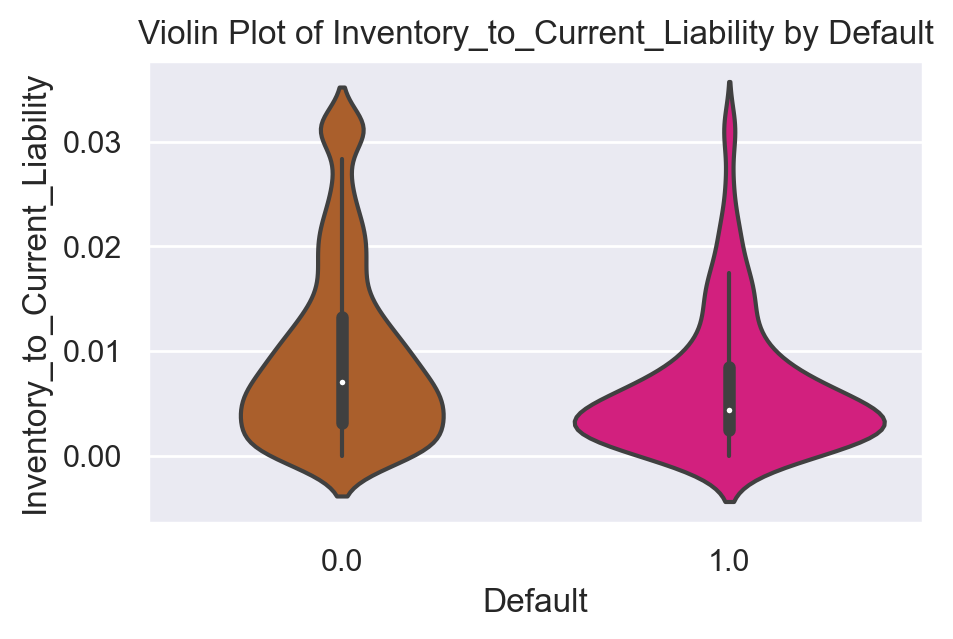

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Long_term_Liability_to_Current_Assets'>

Text(0.5, 1.0, 'Violin Plot of Long_term_Liability_to_Current_Assets by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Long_term_Liability_to_Current_Assets')

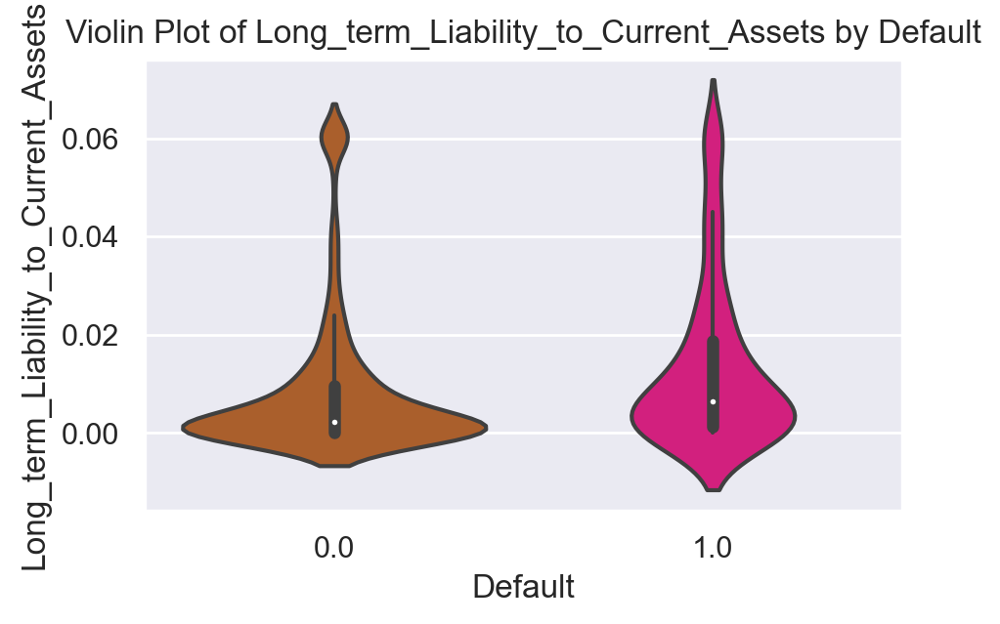

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Total_Expense_to_Assets'>

Text(0.5, 1.0, 'Violin Plot of Total_Expense_to_Assets by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Total_Expense_to_Assets')

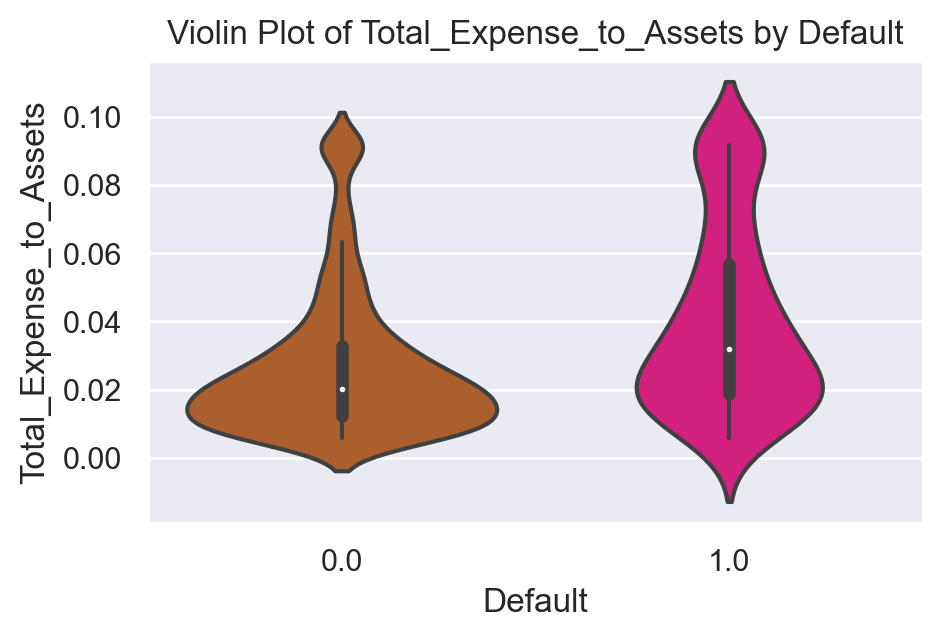

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Quick_Asset_Turnover_Rate'>

Text(0.5, 1.0, 'Violin Plot of Quick_Asset_Turnover_Rate by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Quick_Asset_Turnover_Rate')

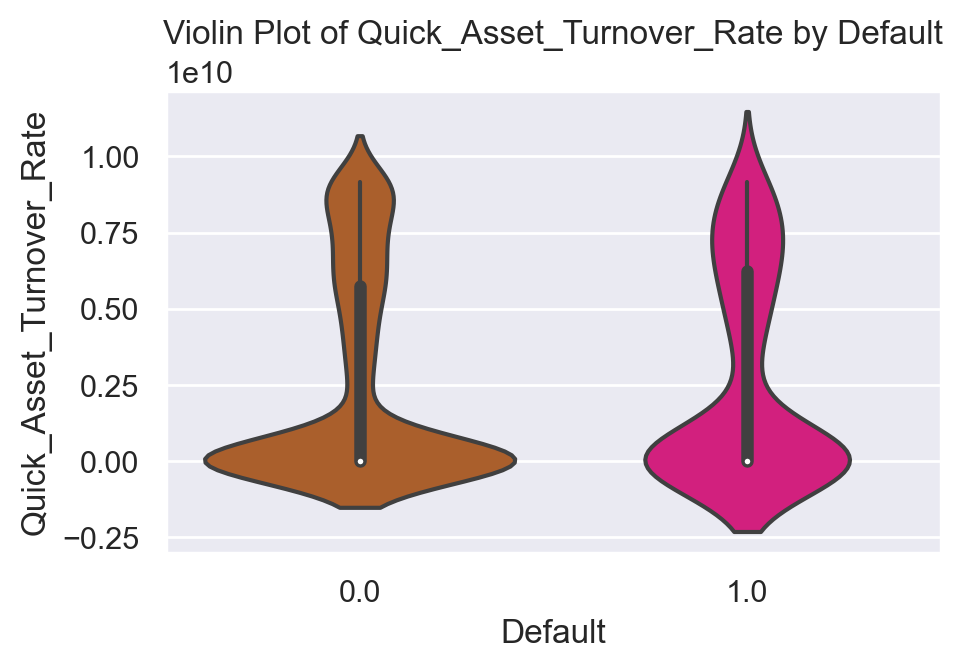

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Cash_Turnover_Rate'>

Text(0.5, 1.0, 'Violin Plot of Cash_Turnover_Rate by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Cash_Turnover_Rate')

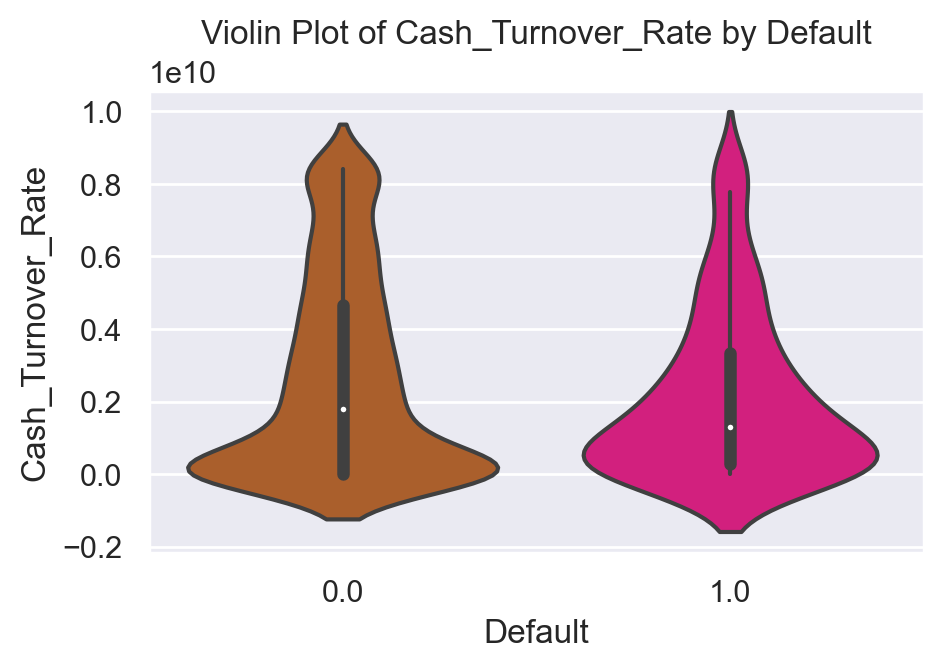

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Fixed_Assets_to_Assets'>

Text(0.5, 1.0, 'Violin Plot of Fixed_Assets_to_Assets by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Fixed_Assets_to_Assets')

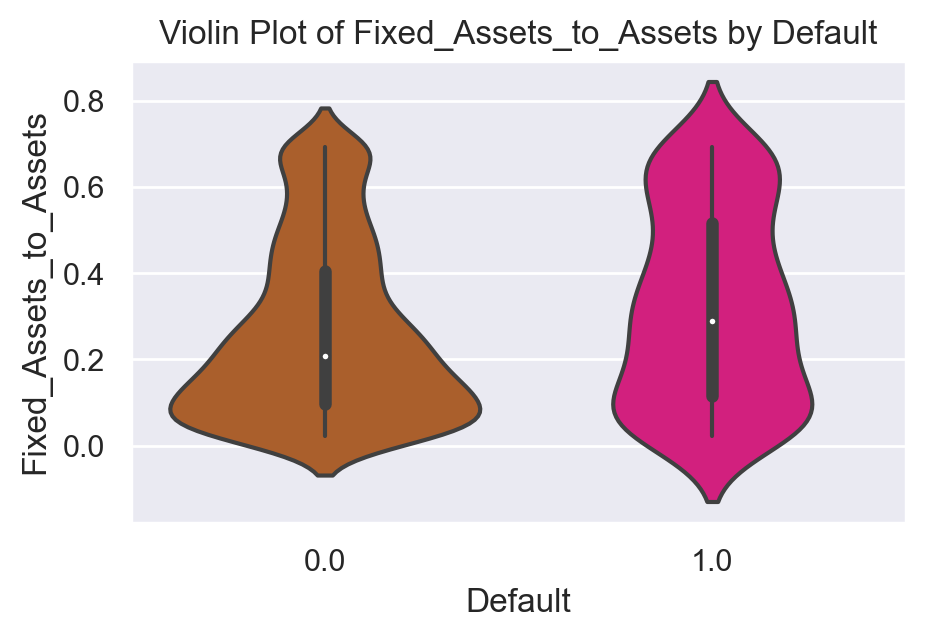

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Total_assets_to_GNP_price'>

Text(0.5, 1.0, 'Violin Plot of Total_assets_to_GNP_price by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Total_assets_to_GNP_price')

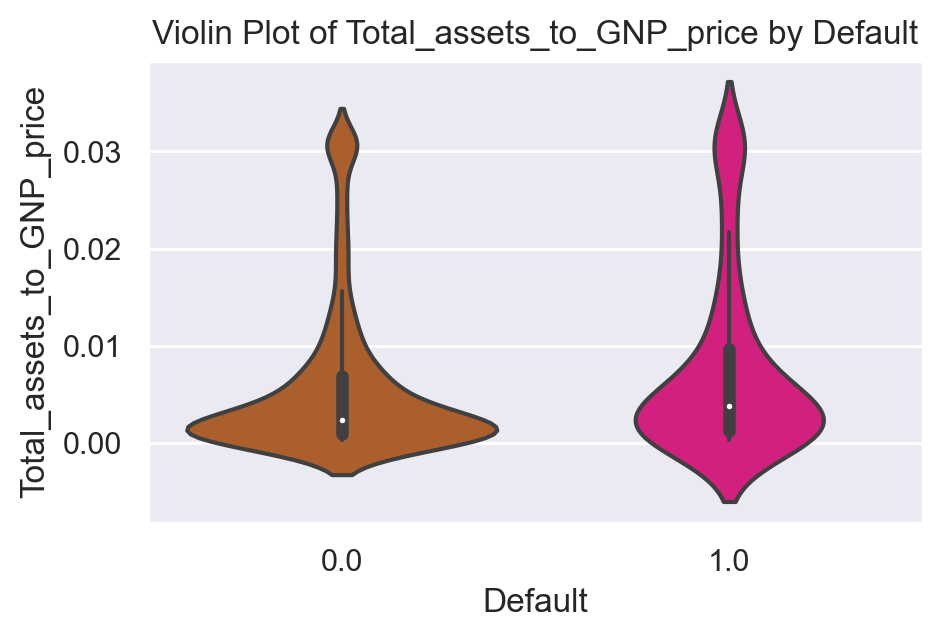

<Figure size 500x300 with 0 Axes>

<Axes: xlabel='Default', ylabel='Equity_to_Liability'>

Text(0.5, 1.0, 'Violin Plot of Equity_to_Liability by Default')

Text(0.5, 0, 'Default')

Text(0, 0.5, 'Equity_to_Liability')

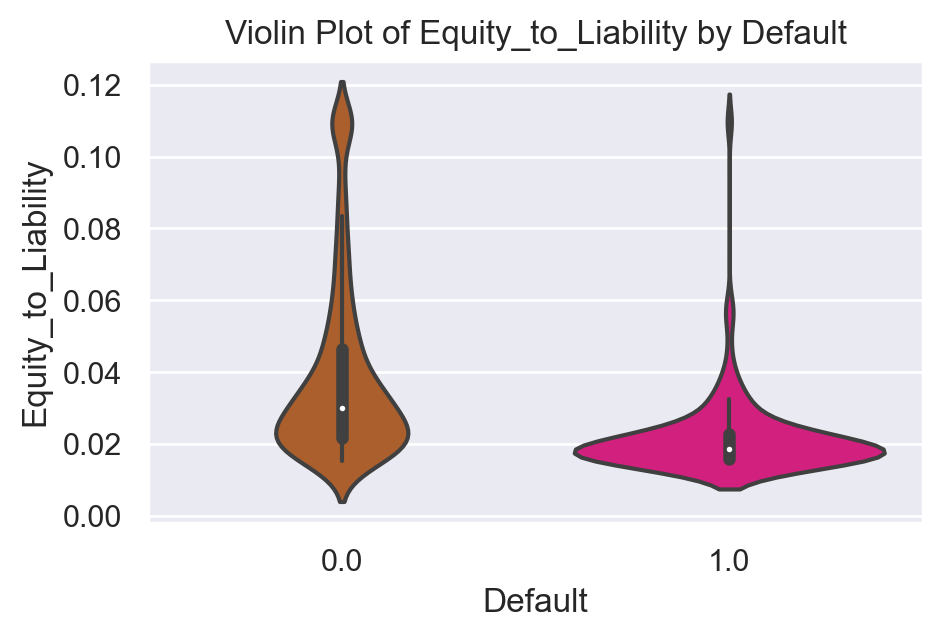

In [45]:
# Violin plots
for column in predictors.columns:
    plt.figure(figsize=(5, 3))
    sns.violinplot(x=target, y=predictors[column])
    plt.title(f'Violin Plot of {column} by Default')
    plt.xlabel('Default')
    plt.ylabel(column)
    plt.show()


In [46]:
# Calculate Spearman's correlation coefficient
correlation = predictors.corrwith(target, method='spearman')

# Print correlation values
print(correlation)


Operating_Expense_Rate                  -0.00
Research_and_Development_Expense_Rate    0.07
Tax_Rate_A                              -0.27
Total_Asset_Growth_Rate                 -0.13
Total_Debt_to_Total_Net_Worth            0.32
Average_Collection_Days                  0.10
Inventory_Turnover_Rate_Times            0.00
Fixed_Assets_Turnover_Frequency          0.08
Allocation_Rate_Per_Person               0.08
Cash_to_Total_Assets                    -0.16
Cash_to_Current_Liability               -0.17
Inventory_to_Current_Liability          -0.11
Long_term_Liability_to_Current_Assets    0.13
Total_Expense_to_Assets                  0.17
Quick_Asset_Turnover_Rate                0.01
Cash_Turnover_Rate                      -0.02
Fixed_Assets_to_Assets                   0.08
Total_assets_to_GNP_price                0.07
Equity_to_Liability                     -0.31
dtype: float64


In [47]:
from sklearn.model_selection import train_test_split

# Split the data into train and test datasets
train_X, test_X, train_y, test_y = train_test_split(predictors, target, test_size=0.33, random_state=42)

# Check the shapes of train and test datasets
print("Train dataset shapes - Predictor variables:", train_X.shape, "Target variable:", train_y.shape)
print("Test dataset shapes - Predictor variables:", test_X.shape, "Target variable:", test_y.shape)

Train dataset shapes - Predictor variables: (1378, 19) Target variable: (1378,)
Test dataset shapes - Predictor variables: (680, 19) Target variable: (680,)


In [48]:
import statsmodels.api as sm
from sklearn.metrics import classification_report, confusion_matrix

# Step 1: Fit Logistic Regression model on the training data
logit_model = sm.Logit(train_y, sm.add_constant(train_X)).fit()

# Step 2: Predict on the train and test data
train_predictions = logit_model.predict(sm.add_constant(train_X))
test_predictions = logit_model.predict(sm.add_constant(test_X))

# Step 3: Convert probabilities to binary predictions
train_predictions_binary = (train_predictions > 0.5).astype(int)
test_predictions_binary = (test_predictions > 0.5).astype(int)

# Step 4: Print classification report and confusion matrix for train dataset
print("Classification Report - Train Dataset:")
print(classification_report(train_y, train_predictions_binary))
print("\nConfusion Matrix - Train Dataset:")
print(confusion_matrix(train_y, train_predictions_binary))

# Step 5: Print classification report and confusion matrix for test dataset
print("\nClassification Report - Test Dataset:")
print(classification_report(test_y, test_predictions_binary))
print("\nConfusion Matrix - Test Dataset:")
print(confusion_matrix(test_y, test_predictions_binary))


Optimization terminated successfully.
         Current function value: 0.230724
         Iterations 9
Classification Report - Train Dataset:
              precision    recall  f1-score   support

         0.0       0.92      0.97      0.95      1225
         1.0       0.60      0.31      0.41       153

    accuracy                           0.90      1378
   macro avg       0.76      0.64      0.68      1378
weighted avg       0.88      0.90      0.89      1378


Confusion Matrix - Train Dataset:
[[1193   32]
 [ 105   48]]

Classification Report - Test Dataset:
              precision    recall  f1-score   support

         0.0       0.93      0.98      0.95       613
         1.0       0.62      0.37      0.47        67

    accuracy                           0.92       680
   macro avg       0.78      0.67      0.71       680
weighted avg       0.90      0.92      0.91       680


Confusion Matrix - Test Dataset:
[[598  15]
 [ 42  25]]


In [49]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Step 1: Initialize the Random Forest classifier
rf_model = RandomForestClassifier(random_state=42)

# Step 2: Fit the Random Forest model on the training data
rf_model.fit(train_X, train_y)

# Step 3: Predict on the train and test data
train_predictions = rf_model.predict(train_X)
test_predictions = rf_model.predict(test_X)

# Step 4: Print classification report and confusion matrix for train dataset
print("Classification Report - Train Dataset:")
print(classification_report(train_y, train_predictions))
print("\nConfusion Matrix - Train Dataset:")
print(confusion_matrix(train_y, train_predictions))

# Step 5: Print classification report and confusion matrix for test dataset
print("\nClassification Report - Test Dataset:")
print(classification_report(test_y, test_predictions))
print("\nConfusion Matrix - Test Dataset:")
print(confusion_matrix(test_y, test_predictions))


RandomForestClassifier(random_state=42)

Classification Report - Train Dataset:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1225
         1.0       1.00      1.00      1.00       153

    accuracy                           1.00      1378
   macro avg       1.00      1.00      1.00      1378
weighted avg       1.00      1.00      1.00      1378


Confusion Matrix - Train Dataset:
[[1225    0]
 [   0  153]]

Classification Report - Test Dataset:
              precision    recall  f1-score   support

         0.0       0.93      0.99      0.96       613
         1.0       0.81      0.31      0.45        67

    accuracy                           0.93       680
   macro avg       0.87      0.65      0.71       680
weighted avg       0.92      0.93      0.91       680


Confusion Matrix - Test Dataset:
[[608   5]
 [ 46  21]]


In [50]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import classification_report, confusion_matrix

# Step 1: Initialize the LDA model
lda_model = LinearDiscriminantAnalysis()

# Step 2: Fit the LDA model on the training data
lda_model.fit(train_X, train_y)

# Step 3: Predict on the train and test data
train_predictions = lda_model.predict(train_X)
test_predictions = lda_model.predict(test_X)

# Step 4: Print classification report and confusion matrix for train dataset
print("Classification Report - Train Dataset:")
print(classification_report(train_y, train_predictions))
print("\nConfusion Matrix - Train Dataset:")
print(confusion_matrix(train_y, train_predictions))

# Step 5: Print classification report and confusion matrix for test dataset
print("\nClassification Report - Test Dataset:")
print(classification_report(test_y, test_predictions))
print("\nConfusion Matrix - Test Dataset:")
print(confusion_matrix(test_y, test_predictions))


LinearDiscriminantAnalysis()

Classification Report - Train Dataset:
              precision    recall  f1-score   support

         0.0       0.93      0.97      0.95      1225
         1.0       0.60      0.39      0.47       153

    accuracy                           0.90      1378
   macro avg       0.76      0.68      0.71      1378
weighted avg       0.89      0.90      0.89      1378


Confusion Matrix - Train Dataset:
[[1185   40]
 [  94   59]]

Classification Report - Test Dataset:
              precision    recall  f1-score   support

         0.0       0.94      0.97      0.95       613
         1.0       0.60      0.45      0.51        67

    accuracy                           0.92       680
   macro avg       0.77      0.71      0.73       680
weighted avg       0.91      0.92      0.91       680


Confusion Matrix - Test Dataset:
[[593  20]
 [ 37  30]]


In [55]:
from imblearn.over_sampling import SMOTE

# Initialize SMOTE with sampling strategy=0.75 and random_state=42
smote = SMOTE(sampling_strategy=0.75, random_state=42)

# Apply SMOTE to the train dataset
train_X_resampled, train_y_resampled = smote.fit_resample(train_X, train_y)

# Check the shape of the resampled train dataset
print("Resampled Train dataset shapes - Predictor variables:", train_X_resampled.shape, "Target variable:", train_y_resampled.shape)


Resampled Train dataset shapes - Predictor variables: (2143, 19) Target variable: (2143,)


Optimization terminated successfully.
         Current function value: 0.379149
         Iterations 8
Classification Report - Train Dataset:
              precision    recall  f1-score   support

         0.0       0.97      0.86      0.91      1225
         1.0       0.40      0.77      0.53       153

    accuracy                           0.85      1378
   macro avg       0.68      0.81      0.72      1378
weighted avg       0.90      0.85      0.87      1378


Confusion Matrix - Train Dataset:
[[1048  177]
 [  35  118]]

Classification Report - Test Dataset:
              precision    recall  f1-score   support

         0.0       0.97      0.88      0.92       613
         1.0       0.41      0.75      0.53        67

    accuracy                           0.87       680
   macro avg       0.69      0.81      0.72       680
weighted avg       0.91      0.87      0.88       680


Confusion Matrix - Test Dataset:
[[540  73]
 [ 17  50]]


<Figure size 500x300 with 0 Axes>

(0.0, 1.0)

(0.0, 1.05)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'Receiver Operating Characteristic (ROC) Curve')

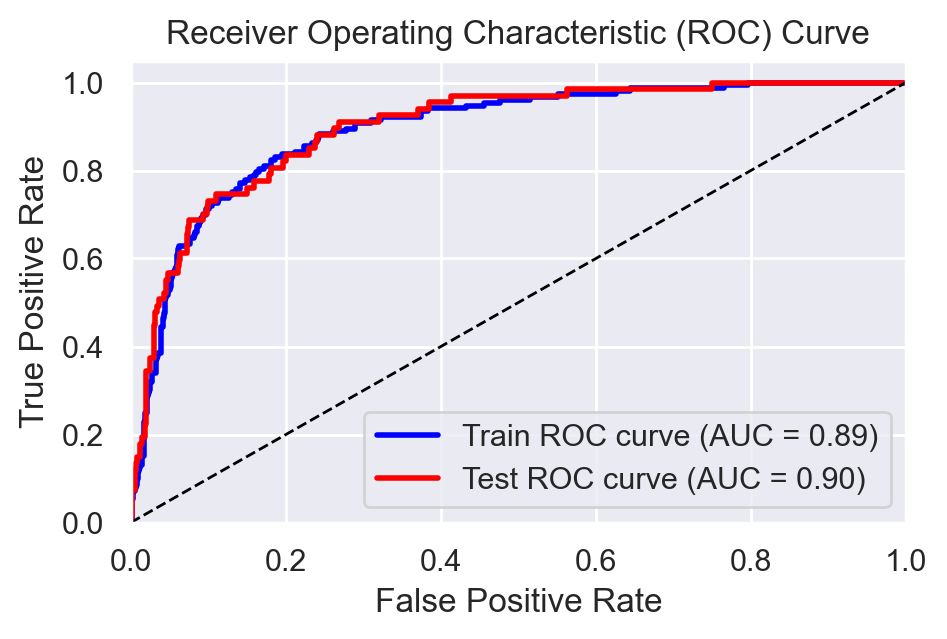

In [56]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Step 2: Fit Logistic Regression model on the resampled training data
logit_model = sm.Logit(train_y_resampled, sm.add_constant(train_X_resampled)).fit()

# Step 3: Predict probabilities on the train and test data
train_probabilities = logit_model.predict(sm.add_constant(train_X))
test_probabilities = logit_model.predict(sm.add_constant(test_X))

# Step 4: Convert probabilities to binary predictions
train_predictions_binary = (train_probabilities > 0.5).astype(int)
test_predictions_binary = (test_probabilities > 0.5).astype(int)

# Step 5: Print classification report and confusion matrix for train dataset
print("Classification Report - Train Dataset:")
print(classification_report(train_y, train_predictions_binary))
print("\nConfusion Matrix - Train Dataset:")
print(confusion_matrix(train_y, train_predictions_binary))

# Step 6: Print classification report and confusion matrix for test dataset
print("\nClassification Report - Test Dataset:")
print(classification_report(test_y, test_predictions_binary))
print("\nConfusion Matrix - Test Dataset:")
print(confusion_matrix(test_y, test_predictions_binary))
# Step 4: Plot ROC curve
train_fpr, train_tpr, _ = roc_curve(train_y, train_probabilities)
test_fpr, test_tpr, _ = roc_curve(test_y, test_probabilities)
train_auc = auc(train_fpr, train_tpr)
test_auc = auc(test_fpr, test_tpr)

plt.figure(figsize=(5, 3))
plt.plot(train_fpr, train_tpr, color='blue', lw=2, label=f'Train ROC curve (AUC = {train_auc:.2f})')
plt.plot(test_fpr, test_tpr, color='red', lw=2, label=f'Test ROC curve (AUC = {test_auc:.2f})')
plt.plot([0, 1], [0, 1], color='black', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


RandomForestClassifier(random_state=42)

Classification Report - Train Dataset:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1225
         1.0       1.00      1.00      1.00       153

    accuracy                           1.00      1378
   macro avg       1.00      1.00      1.00      1378
weighted avg       1.00      1.00      1.00      1378


Confusion Matrix - Train Dataset:
[[1225    0]
 [   0  153]]

Classification Report - Test Dataset:
              precision    recall  f1-score   support

         0.0       0.95      0.96      0.95       613
         1.0       0.60      0.49      0.54        67

    accuracy                           0.92       680
   macro avg       0.77      0.73      0.75       680
weighted avg       0.91      0.92      0.91       680


Confusion Matrix - Test Dataset:
[[591  22]
 [ 34  33]]


<Figure size 500x300 with 0 Axes>

(0.0, 1.0)

(0.0, 1.05)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'Receiver Operating Characteristic (ROC) Curve')

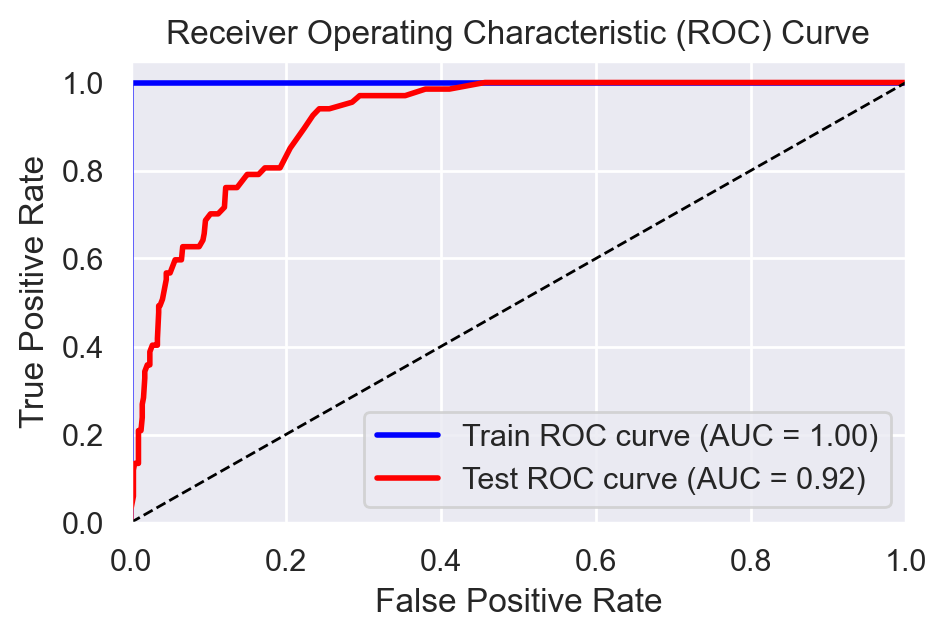

In [57]:
# Step 2: Initialize the Random Forest classifier
rf_model = RandomForestClassifier(random_state=42)

# Step 3: Fit the Random Forest model on the resampled training data
rf_model.fit(train_X_resampled, train_y_resampled)

# Step 4: Predict on the train and test data
train_predictions = rf_model.predict(train_X)
test_predictions = rf_model.predict(test_X)

# Step 5: Print classification report and confusion matrix for train dataset
print("Classification Report - Train Dataset:")
print(classification_report(train_y, train_predictions))
print("\nConfusion Matrix - Train Dataset:")
print(confusion_matrix(train_y, train_predictions))

# Step 6: Print classification report and confusion matrix for test dataset
print("\nClassification Report - Test Dataset:")
print(classification_report(test_y, test_predictions))
print("\nConfusion Matrix - Test Dataset:")
print(confusion_matrix(test_y, test_predictions))

from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Step 7: Calculate probabilities for positive class
train_probs = rf_model.predict_proba(train_X)[:, 1]
test_probs = rf_model.predict_proba(test_X)[:, 1]

# Step 8: Compute ROC curve and AUC
train_fpr, train_tpr, _ = roc_curve(train_y, train_probs)
test_fpr, test_tpr, _ = roc_curve(test_y, test_probs)
train_auc = auc(train_fpr, train_tpr)
test_auc = auc(test_fpr, test_tpr)

# Step 9: Plot ROC curve
plt.figure(figsize=(5, 3))
plt.plot(train_fpr, train_tpr, color='blue', lw=2, label=f'Train ROC curve (AUC = {train_auc:.2f})')
plt.plot(test_fpr, test_tpr, color='red', lw=2, label=f'Test ROC curve (AUC = {test_auc:.2f})')
plt.plot([0, 1], [0, 1], color='black', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()




LinearDiscriminantAnalysis()

Classification Report - Train Dataset:
              precision    recall  f1-score   support

         0.0       0.97      0.85      0.90      1225
         1.0       0.39      0.77      0.52       153

    accuracy                           0.84      1378
   macro avg       0.68      0.81      0.71      1378
weighted avg       0.90      0.84      0.86      1378


Confusion Matrix - Train Dataset:
[[1041  184]
 [  35  118]]

Classification Report - Test Dataset:
              precision    recall  f1-score   support

         0.0       0.97      0.87      0.92       613
         1.0       0.38      0.75      0.51        67

    accuracy                           0.86       680
   macro avg       0.68      0.81      0.71       680
weighted avg       0.91      0.86      0.88       680


Confusion Matrix - Test Dataset:
[[532  81]
 [ 17  50]]


<Figure size 500x300 with 0 Axes>

(0.0, 1.0)

(0.0, 1.05)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'Receiver Operating Characteristic (ROC) Curve')

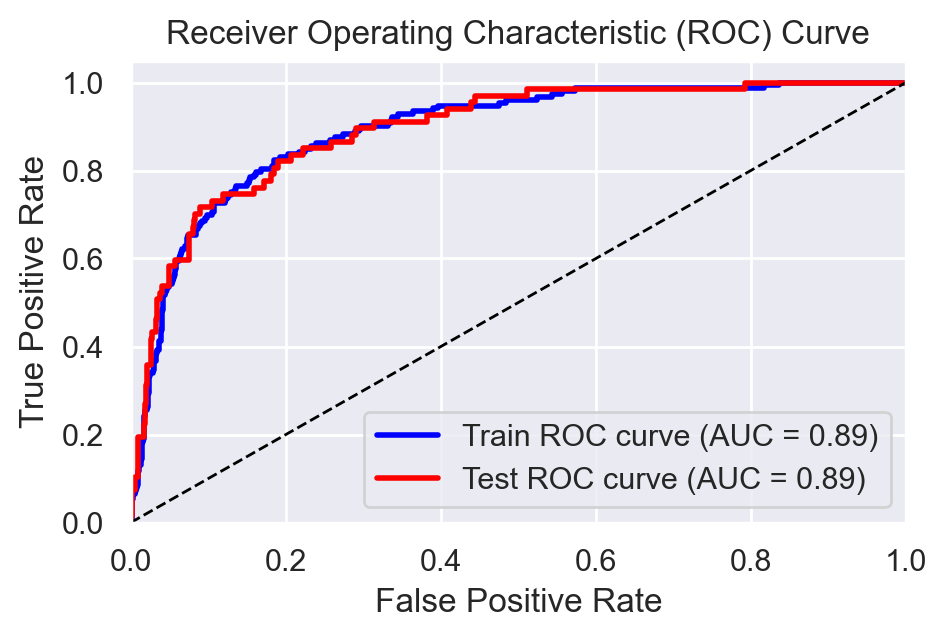

In [58]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Step 2: Initialize the LDA model
lda_model = LinearDiscriminantAnalysis()

# Step 3: Fit the LDA model on the resampled training data
lda_model.fit(train_X_resampled, train_y_resampled)

# Step 4: Predict on the train and test data
train_predictions = lda_model.predict(train_X)
test_predictions = lda_model.predict(test_X)

# Step 5: Print classification report and confusion matrix for train dataset
print("Classification Report - Train Dataset:")
print(classification_report(train_y, train_predictions))
print("\nConfusion Matrix - Train Dataset:")
print(confusion_matrix(train_y, train_predictions))

# Step 6: Print classification report and confusion matrix for test dataset
print("\nClassification Report - Test Dataset:")
print(classification_report(test_y, test_predictions))
print("\nConfusion Matrix - Test Dataset:")
print(confusion_matrix(test_y, test_predictions))

# Step 7: Calculate probabilities for positive class
train_probs = lda_model.predict_proba(train_X)[:, 1]
test_probs = lda_model.predict_proba(test_X)[:, 1]

# Step 8: Compute ROC curve and AUC
train_fpr, train_tpr, _ = roc_curve(train_y, train_probs)
test_fpr, test_tpr, _ = roc_curve(test_y, test_probs)
train_auc = auc(train_fpr, train_tpr)
test_auc = auc(test_fpr, test_tpr)

# Step 9: Plot ROC curve
plt.figure(figsize=(5, 3))
plt.plot(train_fpr, train_tpr, color='blue', lw=2, label=f'Train ROC curve (AUC = {train_auc:.2f})')
plt.plot(test_fpr, test_tpr, color='red', lw=2, label=f'Test ROC curve (AUC = {test_auc:.2f})')
plt.plot([0, 1], [0, 1], color='black', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
